# CCE5108 - Data Science In Python
# Assignment 1: Data Analysis and Visualization

## Prerequisite - Importing Required Python Libraries

In [2]:
#Pandas toolkit to be used for data analysis
import pandas as pd
#Matplotlib and Seaborn to be used for visualization
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
#NumPy and SciPy to be used for numeric and data manipulation
import numpy as np
import scipy as stats
from scipy import stats



## Task 1 - Data Cleaning and Preprocessing (25 Marks)

<b> The dataset contains several files: data for city per day, city per hour, station per day, and station per hour. (There are multiple stations per city, and multiple hours per day.) Choose one appropriate file for your assignment and describe why you chose that file.

The first step will be to import all four datasets(city_day.csv, city_hour.csv, station_day.csv & station_hour.csv) as a Pandas DataFrame. 

In [3]:
City_Day_DF = pd.read_csv('C:\\Users\\Owner\\Desktop\\CCE5108 - Data Science in Python\\Assignment 1 - Data Analysis and Visualization\\city_day.csv')
City_Hour_DF =  pd.read_csv("C:\\Users\\Owner\\Desktop\\CCE5108 - Data Science in Python\\Assignment 1 - Data Analysis and Visualization\\city_hour.csv")
Station_Day_DF =  pd.read_csv("C:\\Users\\Owner\\Desktop\\CCE5108 - Data Science in Python\\Assignment 1 - Data Analysis and Visualization\\station_day.csv")
Station_Hour_DF =  pd.read_csv("C:\\Users\\Owner\\Desktop\\CCE5108 - Data Science in Python\\Assignment 1 - Data Analysis and Visualization\\station_hour.csv",low_memory=False)

In [1], a data quality standard applicable to Big Data is discussed from the perspective of end users. In total, the following four facets of data quality were described as necessary:
1. Availability - Whether the data is accessible to the end-user or not and if it is obtainable in a timely manner. 
2. Usability - The crdibility of the data provider or the data source.
3. Realiability - The accuracy, consistency, integrity and completeness of the data.
4. Relevance - Wether the data meets the users' needs.

Due to the nature of the assignment, data availability and data usability are not relevant when deciding which one of the four files should be selected. This is since the dataset provided for use is freely available on kaggle [2] and has been compiled by the kaggle user VOPANI based on publicly available data provided by the Indian Central Pollution Control Board [3].

On the otherhand, there may be instances where data realibility and data relevance can vary between the four files particularly when it comes to the completness of the data and whether it can be used to answer all five remaining assignment tasks (Relevance).  

To test completness of data, we shall consider the number of missing values in each variable of the four files. The file which has the lowest ratio of missing values for the most variables will be considered for selection.

Following the selection of this file, it will be ensured that this file can be used to adequatley answer all five remaining assignment tasks. 

We shall proceed by analysing the missing data in each of the four files. The following abbreviations will be used to describe each file:
1. CDD - City Per Day 
2. CHD - City Per Hour
3. SDD - Station Per Day
4. SHD - Station Per Hour

In [4]:
#Analysing Missing Values in City_Day_DF

#Obtain Number of Missing Values
CDD_Missing_Values = City_Day_DF.isnull().sum().sort_values(ascending=False)

#Obtain Percentage of Missing Values
CDD_Percentage_Missing_Values = City_Day_DF.isnull().sum().div(City_Day_DF.isnull().count())

#Round Percentage of Missing Values to two Decimal Places
CDD_Rounded_Percentage_Missing_Values = (round(CDD_Percentage_Missing_Values,2)).sort_values(ascending=False)

#Combining the above in one table
CDD_Missing_Info = pd.concat([CDD_Missing_Values, CDD_Rounded_Percentage_Missing_Values], axis=1, keys = ['Missing Values in CDD', 'Percentage of Missing Values in CDD (%)'])

#Show Info on Missing Values for City_Day_DF
CDD_Missing_Info

,Missing Values in CDD,Percentage of Missing Values in CDD (%)
Xylene,18109,0.61
PM10,11140,0.38
NH3,10328,0.35
Toluene,8041,0.27
Benzene,5623,0.19
AQI,4681,0.16
AQI_Bucket,4681,0.16
PM2.5,4598,0.16
NOx,4185,0.14
O3,4022,0.14


In [5]:
#Analysing Missing Values in City_Hour_DF

#Obtain Number of Missing Values
CHD_Missing_Values = City_Hour_DF.isnull().sum().sort_values(ascending=False)

#Obtain Percentage of Missing Values
CHD_Percentage_Missing_Values = City_Hour_DF.isnull().sum().div(City_Hour_DF.isnull().count())

#Round Percentage of Missing Values to two Decimal Places
CHD_Rounded_Percentage_Missing_Values = (round(CHD_Percentage_Missing_Values,2)).sort_values(ascending=False)

#Combining the above in one table
CHD_Missing_Info = pd.concat([CHD_Missing_Values, CHD_Rounded_Percentage_Missing_Values], axis=1, keys = ['Missing Values in CHD', 'Percentage of Missing Values in CHD (%)'])

#Show Info on Missing Values for City_Day_DF
CHD_Missing_Info

,Missing Values in CHD,Percentage of Missing Values in CHD (%)
Xylene,455829,0.64
PM10,296737,0.42
NH3,272542,0.39
Toluene,220607,0.31
Benzene,163646,0.23
PM2.5,145088,0.20
SO2,130373,0.18
O3,129208,0.18
AQI,129080,0.18
AQI_Bucket,129080,0.18


In [6]:
#Analysing Missing Values in Station_Day_DF

#Obtain Number of Missing Values
SDD_Missing_Values = Station_Day_DF.isnull().sum().sort_values(ascending=False)

#Obtain Percentage of Missing Values
SDD_Percentage_Missing_Values = Station_Day_DF.isnull().sum().div(Station_Day_DF.isnull().count())

#Round Percentage of Missing Values to two Decimal Places
SDD_Rounded_Percentage_Missing_Values = (round(SDD_Percentage_Missing_Values,2)).sort_values(ascending=False)

#Combining the above in one table
SDD_Missing_Info = pd.concat([SDD_Missing_Values, SDD_Rounded_Percentage_Missing_Values], axis=1, keys = ['Missing Values in SDD', 'Percentage of Missing Values in SDD (%)'])

#Show Info on Missing Values for City_Day_DF
SDD_Missing_Info

,Missing Values in SDD,Percentage of Missing Values in SDD (%)
Xylene,85137,0.79
NH3,48105,0.45
PM10,42706,0.40
Toluene,38702,0.36
Benzene,31455,0.29
O3,25568,0.24
SO2,25204,0.23
PM2.5,21625,0.20
AQI,21010,0.19
AQI_Bucket,21010,0.19


In [7]:
#Analysing Missing Values in Station_Hour_DF

#Obtain Number of Missing Values
SHD_Missing_Values = Station_Hour_DF.isnull().sum().sort_values(ascending=False)

#Obtain Percentage of Missing Values
SHD_Percentage_Missing_Values = Station_Hour_DF.isnull().sum().div(Station_Hour_DF.isnull().count()).sort_values(ascending=False)

#Round Percentage of Missing Values to two Decimal Places
SHD_Rounded_Percentage_Missing_Values = (round(SHD_Percentage_Missing_Values,2)).sort_values(ascending=False)

#Combining the above in one table
SHD_Missing_Info = pd.concat([SHD_Missing_Values, SHD_Rounded_Percentage_Missing_Values], axis=1, keys = ['Missing Values in SHD', 'Percentage of Missing Values in SHD (%)'])

#Show Info on Missing Values for City_Day_DF
SHD_Missing_Info

,Missing Values in SHD,Percentage of Missing Values in SHD (%)
Xylene,2075104,0.80
NH3,1236618,0.48
PM10,1119252,0.43
Toluene,1042366,0.40
Benzene,861579,0.33
SO2,742737,0.29
O3,725973,0.28
PM2.5,647689,0.25
AQI,570190,0.22
AQI_Bucket,570190,0.22


In [8]:
#To aid us in comparing the missing values between all four datasets, we shall concatenate all of the above created tables 
#representing information on missing values in each dataset into one table. The below code concatenates all four tables
#along their columns
Complete_DF = pd.concat([CDD_Missing_Info,CHD_Missing_Info,SDD_Missing_Info, SHD_Missing_Info], axis=1)
Complete_DF

,Missing Values in CDD,Percentage of Missing Values in CDD (%),Missing Values in CHD,Percentage of Missing Values in CHD (%),Missing Values in SDD,Percentage of Missing Values in SDD (%),Missing Values in SHD,Percentage of Missing Values in SHD (%)
Xylene,18109.0,0.61,455829.0,0.64,85137.0,0.79,2075104.0,0.80
PM10,11140.0,0.38,296737.0,0.42,42706.0,0.40,1119252.0,0.43
NH3,10328.0,0.35,272542.0,0.39,48105.0,0.45,1236618.0,0.48
Toluene,8041.0,0.27,220607.0,0.31,38702.0,0.36,1042366.0,0.40
Benzene,5623.0,0.19,163646.0,0.23,31455.0,0.29,861579.0,0.33
AQI,4681.0,0.16,129080.0,0.18,21010.0,0.19,570190.0,0.22
AQI_Bucket,4681.0,0.16,129080.0,0.18,21010.0,0.19,570190.0,0.22
PM2.5,4598.0,0.16,145088.0,0.20,21625.0,0.20,647689.0,0.25
NOx,4185.0,0.14,123224.0,0.17,15500.0,0.14,490808.0,0.19
O3,4022.0,0.14,129208.0,0.18,25568.0,0.24,725973.0,0.28


In [9]:
#In addition, to aid us in visualising the dataset with the lowest percentage of missing values in each value we will be
# making use of the following code. Only the columns containing the percentage of missing values willl be compares for each
# row (variable)
Highlighted_Complete_DF = Complete_DF.style.highlight_min(subset= ['Percentage of Missing Values in CDD (%)','Percentage of Missing Values in CHD (%)','Percentage of Missing Values in SDD (%)', 'Percentage of Missing Values in SHD (%)'], axis=1)
Highlighted_Complete_DF

,Missing Values in CDD,Percentage of Missing Values in CDD (%),Missing Values in CHD,Percentage of Missing Values in CHD (%),Missing Values in SDD,Percentage of Missing Values in SDD (%),Missing Values in SHD,Percentage of Missing Values in SHD (%)
Xylene,18109.000000,0.610000,455829.000000,0.640000,85137.000000,0.790000,2075104.000000,0.800000
PM10,11140.000000,0.380000,296737.000000,0.420000,42706.000000,0.400000,1119252.000000,0.430000
NH3,10328.000000,0.350000,272542.000000,0.390000,48105.000000,0.450000,1236618.000000,0.480000
Toluene,8041.000000,0.270000,220607.000000,0.310000,38702.000000,0.360000,1042366.000000,0.400000
Benzene,5623.000000,0.190000,163646.000000,0.230000,31455.000000,0.290000,861579.000000,0.330000
AQI,4681.000000,0.160000,129080.000000,0.180000,21010.000000,0.190000,570190.000000,0.220000
AQI_Bucket,4681.000000,0.160000,129080.000000,0.180000,21010.000000,0.190000,570190.000000,0.220000
PM2.5,4598.000000,0.160000,145088.000000,0.200000,21625.000000,0.200000,647689.000000,0.250000
NOx,4185.000000,0.140000,123224.000000,0.170000,15500.000000,0.140000,490808.000000,0.190000
O3,4022.000000,0.140000,129208.000000,0.180000,25568.000000,0.240000,725973.000000,0.280000


The City per Day (CDD) file has the lowest ratio of missing data when considering the variables available across all four files. Only the Station per Day (SDD) file has one variable (NOx) whose percentage of missing values matches that available in the City Per Day file. 

Therefore, we will now focus on ensuring that the City Per Day file can be used to answer all three remaining tasks in the assignment. The summary of the data requirements of each of the five remaining tasks is as follows:
1. Task 2 - Requires the dataset to contain readings for AQI and a variety of pollutant features on a city by city basis.
2. Task 3 - Requires the dataset to contain readings for AQI and a variety of pollutant features on a city by city basis or a station by station basis.
3. Task 4 - Same requirements as Task 2.
4. Task 5 - No specific data requirements.
5. Task 6 - No Specific data requiremtns.

We shall now proceed to print a small excrept and some information about the City per Day file. These two outputs will allow us to understand whether the data requirements of each task are met. 

In [10]:
#Obtaining Small Excrept of City Per Day file
City_Day_DF

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.00,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,0.00,0.00,0.00,54.0,Satisfactory


In [11]:
#Obtaining Information about the City Per Day file
City_Day_DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        29531 non-null  object 
 1   Date        29531 non-null  object 
 2   PM2.5       24933 non-null  float64
 3   PM10        18391 non-null  float64
 4   NO          25949 non-null  float64
 5   NO2         25946 non-null  float64
 6   NOx         25346 non-null  float64
 7   NH3         19203 non-null  float64
 8   CO          27472 non-null  float64
 9   SO2         25677 non-null  float64
 10  O3          25509 non-null  float64
 11  Benzene     23908 non-null  float64
 12  Toluene     21490 non-null  float64
 13  Xylene      11422 non-null  float64
 14  AQI         24850 non-null  float64
 15  AQI_Bucket  24850 non-null  object 
dtypes: float64(13), object(3)
memory usage: 3.6+ MB


Clearly the data requirements of each task is met since readings for AQI and a number of pollutant features are available. In addition all of this data is available on a city by city basis.

<b> Load the dataset and handle missing data and outlier values. Describe what strategy you used for any missing data or outlier values, and why you chose that strategy.

Based on 'City_Day_DF.info()' output, the following variables all have missing data:
1. PM2.5
2. PM10
3. NO
4. NO2
5. NOx
6. NH3
7. CO
8. SO2
9. O3
10. Benzene
11. Toluene
12. Xylene
13. AQI
14. AQI_Bucket

AQI and AQI_Bucket are related [4], whereby AQI values within a specific range fall under the same AQI_Bucket value. As a result, any imputation method selected does not need to be extended for the AQI_Bucket variable and this variable can be filled in according to the AQI imputed values.

AQI is calculated only if atleast one sub-index of PM2.5 and PM10 is available together with any three other sub-indices from SO2, NOx, NH3, CO and O3 [5]. The sub-index of each pollutant is calculated using some form of segmented linear function taking into account the pollutants' concentration level [6]. Hence, it is expected that AQI will be correlated to these pollutants.

In addition, research has shown that a high correlation may exist between pollutants [7]. In [8], NO2 was found to be highly correlated to both PM2.5 and PM10. In a study by carried out by Billionnet et al. [9], it was found that high concentrations of Benzene, Toulene and Xylene are correlated to one another.

We make use of a correlation matrix to examine the correlations between all numerical variables present in our dataset. 

<Axes: >

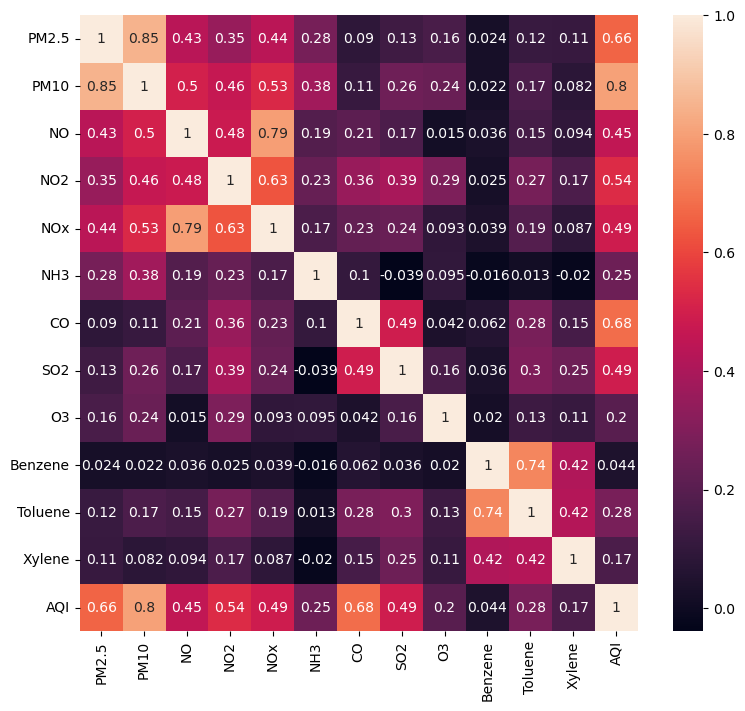

In [12]:
#NB: Need to have latest pandas installed to make use of numeric_only=bool

#Compute pairwise correlation of all columns in DataFrame using Pearson Correlation (Only Numeric Variables considered using
#numeric_only = bool)
Correlation_IncludingMissingValues = City_Day_DF.corr(numeric_only=bool)
#Create Figure and adjust size
plt.figure(figsize=(9, 8))
#Create Color-encoded matrix
sns.heatmap(Correlation_IncludingMissingValues, annot=True)

In addition, let us obtain a correlation matrix when all missing values are excluded so as to check if this has any impact on the correlation matrix.

<Axes: >

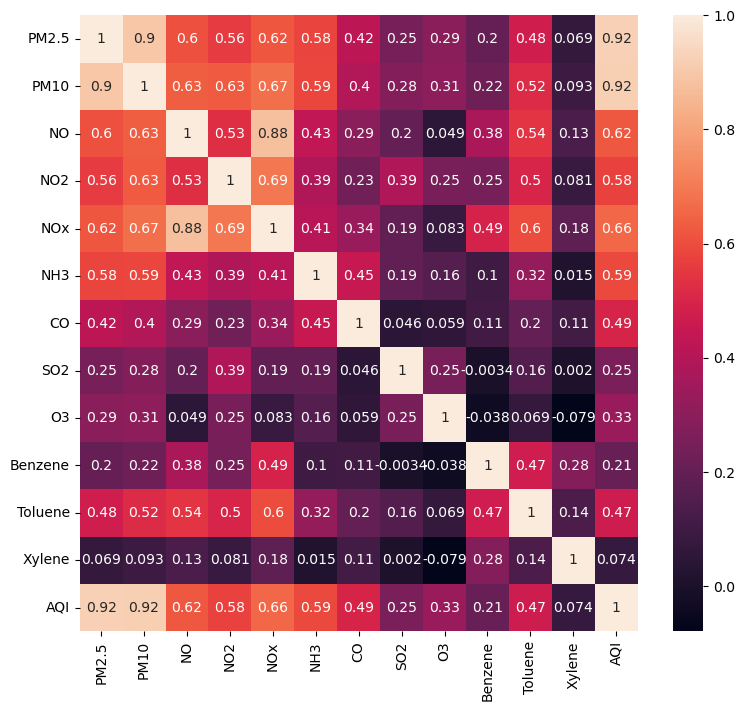

In [14]:
#NB: Need to have latest pandas installed to make use of numeric_only=bool

#Compute pairwise correlation of all columns in DataFrame using Pearson Correlation (Only Numeric Variables considered using
#numeric_only = bool)
Correlation_ExcludingMissingValues = City_Day_DF.dropna().corr(numeric_only=bool)
#Create Figure and adjust size
plt.figure(figsize=(9, 8))
#Create Color-encoded matrix
sns.heatmap(Correlation_ExcludingMissingValues, annot=True)

At a first glance, it is clear that certain pollutants are significantly correlated to one another. Taking a Pearson Correlation value greater than 0.7 to signify high correlation, the following variables are correlated in both matrices:
1. PM2.5 and PM10
2. PM10 and AQI
3. NO and NOx
4. Benzene and Toluene

However, the majority of variables exhibt some form of correlation to one another. In addition, correlation between variables seems to increase when excluding any missing values which might imply that with a complete DataFrame the correlation between variables would have been more pronounced.

To take into account the correlation exhibited by the variables in our data among themselves, the selected missing data imputation method will utilise multiple linear regression. This imputation method will be implemented from scratch to mimic the 'impute.IterativeImputer' function form the Scikit-learn library [10]. The IterativeImputer function is a multivariate imputation algorithm which allows one to utilise all available features/variables in a Dataset to estimate missing data [11].

<b> NB: Whilst AQI is a ordered discrete variable, we will treat it as a continuous variable and hence will allow non-discrete imputations. This is since in [12] and [13], it is argued that making use of continuous methadology in the presence of ordinal data will produce acceptable results when the number of categories is greater than five. Since in our case AQI does not have a set limit of categories, we will proceed to consider it as a continuous variable and therefore make use of multiple linear regression. This implies we will accept AQI imputations which are not discrete. In addition, any negative imputations will not be allowed.

Due to time limitations, only one iteration of the IterativeImputer function will be coded from scratch. The steps followed by my code to replicate the IterativeIMputer function are the following:

NB: The general outline of the IterativeImputer function was obtained from [14].
    
1. Initially a random sampler imputer is utilized to replace any missing values. For each variable, this imputer randomly extracts an available observation of the variable and uses it to replace one missing value of the same variable. Sampling is carried out with replacement. This imputation method does not alter the distribution of the variable.
2. One variable (Variable A for reference) is selected and any data imputed using the random sampler imputer from step 1 are set back to null/missing values.
3. The remaining variables and the non-missing entries for variable A are utilized to build a multiple linear regression model. In this regression model, variable A is the dependent variable and all other variables correspond to the independent variables. 
4. The missing values for variable A are then replaced by the results obtained using the regression model created in Part 3.
5. This process is repeated for all other variables.

<b> NB: The variables imputed using multiple linear regression are utilised to build the regression models for the remaining variables. In other words, once multiple linear regression imputation is carried out for one variable, any values imputed using the random sampler imputer for that variable are discarded.

Let us describe in more detail the multiple linear regression model mentioned in step 3.

The general equation for multiple linear regression is the following [15]: $$\boldsymbol{Y} = \boldsymbol{X}\boldsymbol{\beta} + \boldsymbol{\epsilon}...(1)$$.

Where:

1. $\boldsymbol{Y}$ - Complete set of predicted values of the dependent variable
2. $\boldsymbol{X}$ - Complete set of independent variables
3. $\boldsymbol{\beta}$ - Complete set of regression coefficients
4. $\boldsymbol{\epsilon}$ - Complete set of error terms

Assume we have a total of $N$ independent variables and $n$ data points. Then equation 1 in matrix form becomes [15]:

$$\left(\begin{array}{cc} 
y_{1}\\
y_{2}\\
...\\
y_{n}
\end{array}\right) =
\left(\begin{array}{cc} 
1 & x_{1,1} & x_{1,2} & ... & x_{1,N}\\ 
1 & x_{2,1} & x_{2,2} & ... & x_{2,N}\\ 
... & ... & ... & ... & ...\\
1 & x_{n,1} & x_{n,2} & ... & x_{n,N}
\end{array}\right)
\left(\begin{array}{cc} 
\beta_{0}\\
\beta_{1}\\
...\\
\beta_{N}
\end{array}\right) +
\left(\begin{array}{cc} 
\epsilon_{1}\\
\epsilon_{2}\\
...\\
\epsilon_{n}
\end{array}\right)
$$ 

To obtain estimates for $\boldsymbol{\beta}$, we need to find the regression coefficients which minimize the Mean Square Error (MSE) given by [16]: $$E = \frac{1}{n} \sum(\ddot{y}_{i} - y_{i})^{2} ... (2)$$.

Where:
1. $\ddot{y}_{i}$ - Predicted Value
2. $y_{i}$ - Observed Value

A technique utilised to obtain the minimum of the above function is the Gradient Descent algorithm. In short, Gradient Descent is an iterative algorithm, utilising some form of learning rate to adjust model parameters in the direction of steepest decrease. 

The below figure obtained from [17] displays a diagram of the Gradient Descent algorithm:
![Javatpoint](https://assets-global.website-files.com/5ef788f07804fb7d78a4127a/61d6cfd4637d5faeb5173208_Stochastic-gradient-descent.png)  

At each iteration of the Gradient Descent algorithm, $\boldsymbol{\beta}$ and $\boldsymbol{\epsilon}$ are updated using the following equations [16]:
$$ \boldsymbol{\beta} = \boldsymbol{\beta} - \alpha(\frac{dE}{d\beta})$$
$$ \boldsymbol{\epsilon} = \boldsymbol{\epsilon} - \alpha(\frac{dE}{d\epsilon})$$.

Where:
1. $\frac{dE}{d\beta}$ - Derivative of MSE w.r.t $\boldsymbol{\beta}$
2. $\frac{dE}{d\epsilon}$ - Derivative of MSE w.r.t $\boldsymbol{\epsilon}$


To carry out the above process, my code is split into several functions carried out in succession. The following is a brief description of each function called, listed in order of appearence: 

1. 'Dataset_Split' - Splits the original City_Day_DF into two DataFrames. One DataFrame contains all non-numerical variables (City, Date & AQI_Bucket) and the other DataFrame contains all numerical variables.
2. 'SimpleRandomImputation' - Carries out Random Sample Imputation to impute fill-in any missing data in the DataFrame containing all numerical variables.
3. 'RegressionImputation' - Calls the 'MLR' function to carry out the imputation process.
4. 'New_City_Day_DF' - Append the DataFrame containing non-numerical variables to the DataFrame obtained after applying the 'RegressionImputation' function. This is done in such a way so as to obtain a DatFrame in a similar format as the 'City_Day_DF'. This DataFrame will be referred to as 'New_City_Day_DF'

We will start off by defining all required functions:

In [15]:
def Dataset_Split(Dataset):
    
    """Splits complete DataFrame into two seprate DataFrames. One DataFrame will contain data relevant to the 
       regression imputation process. The other DataFrame will contain any remaining data. In addition, column
       labels of the DataFrame relevant to the regression imputaion process are obtained.

    Args:
        Dataset (Pandas DataFrame): The complete data set under study

    Returns:
        DataSet_RI (Pandas DataFrame): Contains all data relevant to the regression imputation process
        Dataset_RC (Pandas DataFrame): Contains all data from Dataset excluding any data included in DataSet_RI
        Dataset_RI.columns (Column Labels): Contains all column labels for DataSet_RI
        
    """
    #Storing all columns to be used for Regression Imputation (RI)
    Dataset_RI = Dataset.drop(['City','Date','AQI_Bucket'], axis=1)
    #Storing Remaining Columns (RC)
    Dataset_RC = Dataset[["City","Date","AQI_Bucket"]]
    
    return Dataset_RI, Dataset_RC, Dataset_RI.columns

In [16]:
#Random Imputation (All Misisng Values are filled in with another value from the same column) 
#Also Known as Simple Random Imputation 
#(Will Return dataset with original data together with another dataset with simple random imputation applied appended to it)
def SimpleRandomImputation(Dataset, Columns_MissingData):
    
    """Carries out Simple Random Imputation (All missung values in one column of a DataFrame, are filled in with
       another value from the same column.

    Args:
        Dataset (Pandas DataFrame): The DataFrame containing all data relevant to the regression imputation process.
        Columns_MissingData (Column Labels): Contains all column labels for DataSet obtained after running "Dataset_Split"
        function.

    Returns:
        DataSet (Pandas DataFrame): DataFrame containing all data relevant to the regression imputation process after
        simple regression is applied appended to the dataframe in its original state
        
    """
    
    #For loop going over all columns with missing data as defined previously
    
    for Column in Columns_MissingData:
        #Create copy of "Column", rename it as "Column_imputed" and append to end of Dataset
        Dataset[Column + '_imputed'] = Dataset[Column]
        #Calculate number of missing/empty values in "Column"
        EmptyFigure = Dataset[Column].isnull().sum()
        #Create series containing all non-empty/non-missing figures in "Column"
        NON_EmptyFigure = Dataset.loc[Dataset[Column].notna(), Column] 
        #Replace all missing/empty figures in "Column_imputated" with some random figure from the NON_EmptyFigure series 
        np.random.seed(0)
        Dataset.loc[Dataset[Column].isnull(), Column + '_imputed'] =  np.random.choice(NON_EmptyFigure, size=EmptyFigure, replace = True)

    return Dataset

In [17]:
def MLR(x_train, y_train, alpha, it):
    
    """Carries out Multiple Linear Regression (MLR) from scratch

    Args:
        x_train (numpy representation): Independent training set equivalent to all but column defined in for loop within "RegressionImputation"
        y_train (numpy representation): Dependent training set equivalent to column defined in for loop within "RegressionImputation"
        alpha: The learning rate of MLR model (Speed at which gradien moves during gradient descent)
        it: Number of Iterations to be carried out

    Returns:
        Weight (To Check): Array of Weight Values
        Bias (To Check): Bias Value used to calcualte Missing Data Values
        CostF_List (To Check): A list of all Cost Function Results
    """
    
    #Obtain number of data points in our dataset (equivalent to number of rows)
    N = y_train.size
    #Initial weight of Gradient Descent 
    Weight = np.zeros((x_train.shape[1],1))
    #Initial Bias of Gradient Descent
    Bias = 0
    #Keeping track of Cost Function values 
    #Def: Measure the difference between the predicted 
    #value of the model and the actual target value[]
    CostF_List = []
    
    #For loop to be carried out until number of required iterations is achieved
    for i in range(it):
        #Prediction of Missing Value
        y_pred = x_train.dot(Weight)
        #Obtaining Cost Function Result
        CostF = (1/(2*N))*np.sum(np.square(y_pred - y_train.reshape(y_train.shape[0],1)))
        #Calculating Gradient Descent
        d_Weight = (1/N)*np.dot(x_train.T, y_pred - y_train.reshape(y_train.shape[0],1))
        d_Bias = (1/N) * np.sum(y_pred - y_train.reshape(y_train.shape[0],1))
        #Updating the Weights 
        Weight = Weight - alpha*d_Weight
        #Updating the Bias
        Bias = Bias - alpha*d_Bias
        #Append all Cost Function Results
        CostF_List = [].append(CostF)
        
        # Print Cost Function Results
        if(i%(it/10) == 0):
            print("Cost is :", CostF)
    
    return Weight, Bias, CostF_List

In [18]:
#Creating Dataset with Regression Imputation applied to all Non-Missing entries in Dataset
#Inputs include:
#Dataset - Containing only Relevant Data (defined previously)
#it - Number of iterations for Multiple Linear Regression
#alpha - Learning Rate of Multiple Linear Regression
def RegressionImputation(Dataset,Columns_MissingData, it, alpha):
    
    """Calls MLR function and carries out the regression imputation process

    Args:
        Dataset (Pandas DataFrame): DataFrame output obtained after applying the SimpleRandomImputation function 
        Columns_MissingData (Column Labels): Contains all column labels for DataSet obtained after running "Dataset_Split"
        function.
        it: Number of Iterations to be carried out
        alpha: The learning rate of MLR model (Speed at which gradien moves during gradient descent)
        

    Returns:
        deter_data (Pandas DataFrame): DataFrame Output obtained following regression imputation
    """    
    
    #Simply List Column Names for Values filled in + the word Deterministic Before
    deter_data = pd.DataFrame(columns = ["Deterministic" + name for name in Columns_MissingData])
    
    #For loop going over all columns with missing data as defined previously
    for feature in Columns_MissingData:

        #In "deter_data" table defined previously create a copy of "imputed" data in "Dataset" 
        deter_data["Deterministic" + feature] = Dataset[feature + "_imputed"]
        #Parameters will include only columns to be used to impute column with missing data
        parameters = list(set(Dataset.columns) - set(Columns_MissingData) - {feature + '_imputed'})

        #Linear Regression model to predict missing data
        
        #Independent Training Set (Returning Numpy Representation)
        x_train = Dataset[parameters].values
        #Dependent Training Set (Returning Numpy Representation)
        y_train = Dataset[feature + '_imputed'].values
        #Carrying out Multiple Linear Regression
        Weight, Bias, CostF_List = MLR(x_train,y_train, alpha, it)
        #Obtaining Independent Test Set (Returning Numpy Representation)
        x_test = Dataset[parameters].values
        #Calculating Independent Training Set using dot product + Bias (Equation utilised in Multiple Linear Regression)
        Hello = np.dot(x_test[Dataset[feature].isnull()],Weight) + Bias
        #Imposing Restriction of no negative values
        Hello[Hello < 0] = 0
        #Replacing any missing data in "feature" column with calculated data for the same feature column
        deter_data.loc[Dataset[feature].isnull(), "Deterministic" + feature] = Hello
        
    return deter_data

In [19]:
#Change deter_data imp
def New_City_Day_DF(deter_data,Dataset_RC):

    """Transforms DataFrame following regression imputation into the required format

    Args:
        deter_data (Pandas DataFrame): DataFrame Output obtained after running the "RegressionImputation" function.
        Dataset_RC (Pandas DataFrame): DataFrame Output containing all data non- relevant to the regression 
        imputation process obtained after running the "Dataset_Split" function
        
        

    Returns:
        deter_data (Pandas DataFrame): DataFrame Output obtained in the required format
    """    
    
    
    #Rename all Data to original names (i.e. removing Deterministic)
    deter_data.rename(columns = {'DeterministicPM2.5':'PM2.5','DeterministicPM10':'PM10',
                         'DeterministicNO':'NO','DeterministicNO2':'NO2','DeterministicNOx':'NOx',
                         'DeterministicNH3':'NH3','DeterministicCO':'CO','DeterministicSO2':'SO2',
                         'DeterministicO3':'O3','DeterministicBenzene':'Benzene','DeterministicToluene':'Toluene',
                         'DeterministicXylene':'Xylene','DeterministicAQI':'AQI'}, inplace = True)
    #Adding all Non_Relevant Columns
    deter_data = Dataset_RC[['City','Date']].join(deter_data).join(Dataset_RC[['AQI_Bucket']])
    
    
    return deter_data

In [20]:
#Calling the Dataset_Split function
Dataset_RI, Dataset_RC, Columns_MissingData = Dataset_Split(City_Day_DF)

In [21]:
#Calling the SimpleRandomImputation function
Dataset = SimpleRandomImputation(Dataset_RI, Columns_MissingData)

In [22]:
#Calling the RegressionImputation function
deter_data = RegressionImputation(Dataset, Columns_MissingData, it = 10000, alpha = 0.00001)

Cost is : 4342.460361716501
Cost is : 1256.0657426213374
Cost is : 1233.8127829714365
Cost is : 1221.245796958376
Cost is : 1214.0781609974124
Cost is : 1209.9878906061515
Cost is : 1207.6530578150337
Cost is : 1206.319978871233
Cost is : 1205.558724645843
Cost is : 1205.123954102631
Cost is : 10933.595701256307
Cost is : 3235.9812042083854
Cost is : 3208.937653562346
Cost is : 3193.284670728569
Cost is : 3184.164865521872
Cost is : 3178.848879147067
Cost is : 3175.749359882854
Cost is : 3173.941824331703
Cost is : 3172.8875812018396
Cost is : 3172.272629775663
Cost is : 414.6822475009313
Cost is : 137.84790726181745
Cost is : 137.8013014023779
Cost is : 137.7741472627165
Cost is : 137.75803597828335
Cost is : 137.7484705810782
Cost is : 137.7427911915095
Cost is : 137.73941907332735
Cost is : 137.73741688855344
Cost is : 137.73622809744896
Cost is : 712.4242647336698
Cost is : 182.4831053019527
Cost is : 182.2161774445505
Cost is : 182.0784232953368
Cost is : 181.99768985073246
Cost i

In [23]:
#Calling the New_City_Day_DF function and labelling function as New_City_Day_DF
New_City_Day_DF_IMP = New_City_Day_DF(deter_data, Dataset_RC)

As described previously, AQI and AQI_Bucket are related whereby AQI values are grouped into categories. The AQI ranges for each AQI_Bucket category for our Dataset are available in [18] and can be seen in the below figure:
![AQI_Bucket](https://i.imgur.com/XmnE0rT.png) 


Even though the AQI ranges for each AQI_Bucket are available online, let us try to obtain these same ranges using the non-missing AQI and AQI_Bucket values in our Dataset. To do so we will define a function 'AQI_Range' which will go over all the different categrories of the AQI_Bucket variable and obtain the highest and lowest AQI reported for each category.

In [24]:
def AQI_Range(Original_Dataset):

    """Obtains range of AQI values used to form categories in AQI_Bucket Column

    Args:
        Original_Dataset (Pandas DataFrame): The complete data set under study (No Regression Imputation Applied) 

    Returns:
        DataFrame (Pandas DataFrame): DataFrame Output obtaining all AQI value ranges for each AQI_Bucket value
    """    
    
    
    #Obtain Only 'AQI' and 'AQI_Bucket' columns from Original Dataset
    Dataset = Original_Dataset[['AQI','AQI_Bucket']]
    #Obtain Dataset ("Dataset2") where AQI column is non-missing
    Dataset2 = Dataset[Dataset['AQI'].notnull()]
    #List to contain AQI_Bucket Value
    Listi = []
    #List to contain Minimum AQI
    ListMin = []
    #List to Contain Maximum AQI
    ListMax = []
    
    #For loop going over all unique AQI_Bucket values in "Dataset2" 
    for i in Dataset2['AQI_Bucket'].unique():
        #Obtain Dataset ("Dataset3") where all entries belong to the same AQI_Bucket Value
        DataSet3 = Dataset2.loc[Dataset2['AQI_Bucket'] == i]
        #Minimum AQI value in "Dataset3"
        Minimum = DataSet3['AQI'].min()
        #Maximum AQI value in "Dataset3"
        Maximum = DataSet3['AQI'].max()
        #Append AQI_Bucket Value
        Listi.append(i)
        #Append Corresponding Minimum value to list
        ListMin.append(Minimum)
        #Append Corresponding Maximum Value to list
        ListMax.append(Maximum)  
    
    #Create Dataframe to hold all information
    Data = {'AQI_Bucket': Listi, 'Minimum_AQI': ListMin, 'Maximum_AQI' : ListMax}
    Filled_In_Data = pd.DataFrame(data=Data)
    
    return Filled_In_Data

In [25]:
#Call AQI_Range Function
AQI_Ranges = AQI_Range(City_Day_DF)
#Sort the DataFrame Obtained in ascending order by the Minimum_AQI column
AQI_Ranges.sort_values(by=['Minimum_AQI'])

,AQI_Bucket,Minimum_AQI,Maximum_AQI
5,Good,13.0,50.0
4,Satisfactory,51.0,100.0
3,Moderate,101.0,200.0
0,Poor,201.0,300.0
1,Very Poor,301.0,400.0
2,Severe,401.0,2049.0


Each AQI_Buckets category and their respective minimum and maximum AQI values match those found online in [18]. 

We will now proceed to fill in any missing data for the AQI_Bucket variable in our New_City_Day_DF based on the imputed AQI values obtained previously. To do so we define a function 'Fill_AQIBucket' which takes all AQI values and maps them to an AQI_Bucket value according to the ranges defined in [18].

<b> NB: All AQI values are considered (I.e. not simply the AQI values corresponding to missing AQI_Bucket values). This is done since any non-missing AQI_Bucket values will retain the same category value and it is easier to write the code for all variables.

In [26]:
#Code to Fill in Missing Data in AQI Bucket

def Fill_AQIBucket(deter_data):
    
    """Fill in Missing Data under AQI_Bucket column for DataFrame obtained following Regression Imputation

    Args:
        deter_data (Pandas DataFrame): DataFrame obtained after running the "New_City_Day_DF" function.

    Returns:
        deter_data (Pandas DataFrame): DataFrame with all values filled in for QI_Bucket column according to their respective
        AQI values
    """  
    
    #Replace values in AQI_Bucket column with AQI values
    deter_data["AQI_Bucket"] = deter_data["AQI"]

    #Consider AQI_Bucket column
    col         = 'AQI_Bucket'
    #Conditions to fill AQI_Bucket Column
    conditions  = [ (deter_data[col] >= 201) & (deter_data[col] < 301),
                    (deter_data[col] >= 301) & (deter_data[col] < 401),
                    (deter_data[col] >= 401),
                    (deter_data[col] >= 101) & (deter_data[col] < 201),
                    (deter_data[col] >= 51) & (deter_data[col] < 101),
                    (deter_data[col] >= 0) & (deter_data[col] < 51)]
    #All Possible Choices
    choices     = [ "Poor", 'Very Poor', 'Severe', 'Moderate', 'Satisfactory', 'Good' ]

    #Replace AQI_Bucket values with all possible choices
    deter_data["AQI_Bucket"] = np.select(conditions, choices, default=np.nan)
    
    return deter_data

In [27]:
#Callign Fill_AQIBucket and obtaining New_City_Day_DF function with all missing values imputed
New_City_Day_DF_IMP = Fill_AQIBucket(New_City_Day_DF_IMP)

Outliers for each variable will be identified using the IQR method. This method was selected due to two main reasons [19][20]:

1. It is a Robust Technique - Less sensitive to extreme values in data since quartile 1, median and quartile 3 are all robust against outliers. 
2. It is Non-Parametric - Does not make any assumptions on the data and hence it can be utilised to detect outliers for skewed data.

The following image obtained from [21] displays how the IQR is utlised to identify outliers.

![AQI_Bucket](https://miro.medium.com/v2/resize:fit:640/format:webp/0*eWVAvOhL32nvU4Tq.png) 

The following statistical tools are shown in the above image:
1. Quartile 1 (Q1) - The 25th percentile of a dataset. Indicating the value below which 25% of the data falls after ordering data.
2. Median - The middle number or average of two middle numbers obtained after ordering the data of one variable.
3. Quartile 3 (Q3) - The 75th percentile of a dataset. Indicating the value below which 75% of the data falls after ordering data.
4. Interquartile Range (IQR)- The Difference between Q3 and Q1
5. Q1 - 1.5*IQR/Q3 +1.5*IQR - Lower and Upper 'Fences' (Also refered to as Tukey Fences) whereby any value beyond this point is highlighted as an outler. The 1.5 scaler multiple was first introduced by John W. Tukey [22].

We will start of by obtaining the Tukey Fences for our 'New_City_Day_DF' Dataset.

In [30]:
#Defining all numerical variables to be analysed for any outliers using the IQR method
Outlier_Detection_List = ['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3','Benzene','Toluene','Xylene','AQI']

#Creating a Copy of our Imputed Dataset and naming it New_City_Day_DF_Cap
New_City_Day_DF_Cap = New_City_Day_DF_IMP.copy()

#Creating empty list to hold variable name and corresponding lower limits and upper lmits at each iteration
ilist = []
lowerlimitlist =[]
upperlimitlist = []

#for loop going over all numerical variables listed in Outlier_Detection_List
for i in Outlier_Detection_List:
    #Obtaining Quartile 1 of data in variable i
    Q1 = New_City_Day_DF_IMP[i].quantile(0.25)
    #Obtaining Quartile 3 of data in Variable i
    Q3 = New_City_Day_DF_IMP[i].quantile(0.75)
    #Obtaining Interquartile Range (IQR)
    IQR = Q3 - Q1
    #Defining Tukey Fences
    lowerlimit = Q1 - 1.5*IQR
    upperlimit = Q3 + 1.5*IQR
    ilist.append(i)
    lowerlimitlist.append(lowerlimit)
    upperlimitlist.append(upperlimit)
    
    #Create Dataframe to hold all information
    DataOutlier = {'Measurement': ilist, 'Lower_Limit': lowerlimitlist, 'Upper_Limit' : upperlimitlist}
    OutlierLimits = pd.DataFrame(data=DataOutlier)
    
    outliers = New_City_Day_DF_IMP[(New_City_Day_DF_IMP[i] < lowerlimit) | (New_City_Day_DF_IMP[i] > upperlimit)]
    New_City_Day_DF_Cap[i] = np.where(New_City_Day_DF_IMP[i] > upperlimit, upperlimit,
                                     np.where(New_City_Day_DF_IMP[i] < lowerlimit, lowerlimit,
                                            New_City_Day_DF_IMP[i]))

In [31]:
#Printing DataFrame displaying each variable and their corresponding Tukey Fences
OutlierLimits

,Measurement,Lower_Limit,Upper_Limit
0,PM2.5,-44.335543,156.025905
1,PM10,-59.856604,277.113962
2,NO,-15.924657,42.274429
3,NO2,-23.370000,72.950000
4,NOx,-22.611761,75.215057
5,NH3,-15.754297,55.596578
6,CO,-1.030000,3.050000
7,SO2,-8.166416,29.424027
8,O3,-18.397500,81.382500
9,Benzene,-4.475000,7.725000


Clearly no measurment can be below $0$, as a result no value in any variable is less than their lower limit threshold defined above.

On the otherhand, values in a number of variables may exceed their respective upper limit threshold defined above. In addition, it is completly possible that any tools used to measure pollutant levels can capture such a high amount and I have no way to disprove these figures. As a result, I do not believe that removing these outliers would be beneficial. Instead winsorization will be selected to reduce the weight of outliers [22]. Effectively, any variable value exceeding the variables upper lmit as defined above will be capped to this upper limit value. In such a way, the impact of outliers is diminished however the propensity for large variable values will still be seen in the data. Winsorization however is likely to cause artificial spikes at the end of data. 

<b> This Winsorization technique has been included in the above code and a new Dataset named New_City_Day_DF_Cap is obtained.

In [32]:
#Re-run Fill_AQIBucket function to adjust AQI_Bucket categories since AQI values have been adjusted
New_City_Day_DF_Cap = Fill_AQIBucket(New_City_Day_DF_Cap)

## Task 2 - Data Analysis and Visualization (25 Marks)

<b> Obtain Descriptive Statistics of the dataset

Descriptive Statistics refer to a set of summary statistics which can be utilised to describe the variables in a dataset [23]. In general, descriptive statistics can be split into two broad groups [24]:

1. Measures of Central Tendency - Aims to describe all data related to a variable using one single figure representing the "middle" of the variables' distribution [25]. There are three common measures of central tendency: 
    1. Mean - The sum of all data for one variable divided by the number of data points [25]
    2. Median - The middle number or average of two middle numbers obtained after ordering the data of one variable in ascending/descending order [25]
    3. Mode - The value which occurs most frequently when considering all data points of a variable. Generally utilised for nominal data. 
<p> $\\[.3cm]$ </p> 
2. Meausres of Dispersion or variation - Aims to describe the degree of similarity/dissimilarity for all data related to a variable [25].
    1. Frequency Distribution - A statistical representation of how data is distributed across various categories or values (Binning Required if continuous data). The Frequency Distribution can be represented graphicaly using a Histogram for continuous data or a Bar Chart for categorical data [26].
    2. Range - The difference between the minimum and maximum values of all data in a variable
    3. Interquartile Range (IQR)- As defined in task 1 the IQR encapsulates the following summary statistics: the first quartile, representing the 25th percentile; the mean representing the 50th percentile; and the third quartile, representing the 75th percentile. The difference between the third and first quartiles is referred to as the interquartile range [24]. The Interquartile range is can be represented graphically by means of a box plot.
    4. Variance - Measures the disperation of data points in a variable compared to the mean of the variable. If a variable has data spread over a large range of values, then the standard deviation of the sample will be high.
    5. Standard Deviation -  It is equivalent to the square root of the variance.
<p> $\\[0.3cm]$ </p> 

In addition to the above two broad groups, other descriptive statistics are the following:
1. Skewness - Measures the difference between the distribution of a variable and that of a symmetric distribution [27]. Can be visualised using a Histogram.
    1. A skewness value of $0$ implies that the data is perfectly symmetical across its mean.
    2. A positive skewness value implies that the data is positively skewed hence shifted to the left of the mean. 
    3. A negative skewness value implies that the data is negatively skewed hence shifted to the right of the mean.
<p> $\\[.3cm]$ </p>    
2. Kurtosis - Measures the difference between the deviating values of a variable to the deviation present in a standard normal distribution [27].  Can be visualised using a Histogram.
    1. A Leptokurtic (Positive Kurtosis) value - Data has a sharper peak around the mean when compared to a normal distribution. Remaining data points are situated around the tails of the distribution implying that extreme values are more likely to occur.
    2. A Platykurtosis (Negative Kurtosis) value - Data is spread out across the entire range with a thinner tail and flatter peaks when compared to a normal distribution.
    3. A Mesokurtic (Zero Kurtosis) value - Distribution of data is similar to that of a normal distribution. 

From the above mentioned descriptive statistics, the following outputs can be obtained using 'pandas.DataFrame.describe':
1. The Count (No. of data points under each variable)
2. The Mean
3. The Standard Deviation 
4. The Minimum Value
5. The 1st Quartile
6. The Median
7. The Third Quartile
8. The Maximum Value

In addition, the following outputs are obtained for categorical variables:
1. Unique - The number of unique entries under each variable
2. top - Equivalent to the mode
3. freq - The number of times the mode appears in Dataset

In [33]:
#Obtaining count, frequency, mean, standard deviation, minimum value, 1st quartile, median, 2nd quartile and maximum value descriptive statistics
Desc_Stats = New_City_Day_DF_Cap.describe(include= 'all')
Desc_Stats

#Split data into Categorical and Numerical 
Desc_Stats_Categorical = Desc_Stats.iloc[:4, [0,1,-1]]
Desc_Stats_Numerical = Desc_Stats.iloc[[0,4,5,6,7,8,9,10] ,2:-1 ]

We will start of by discussing the results obtained for the non-numerical variables in our Dataset (City, Date and AQI_Bucket)

In [34]:
#Calling Desc_Stats_Categorical defined previously
Desc_Stats_Categorical

,City,Date,AQI_Bucket
count,29531,29531,29531
unique,26,2009,5
top,Ahmedabad,2020-07-01,Moderate
freq,2009,26,11615


In [35]:
#Obtain one-way Frequency Table for City using pandas 'crosstab' function 
freq_table = pd.crosstab(New_City_Day_DF_Cap['City'], 'Entries In City') 
#Sort Frequency Table in Descending Order
freq_table_city = freq_table.sort_values(by = ['Entries In City'], ascending= False)
freq_table_city



col_0,Entries In City
City,
Ahmedabad,2009
Delhi,2009
Mumbai,2009
Bengaluru,2009
Lucknow,2009
Chennai,2009
Hyderabad,2006
Patna,1858
Gurugram,1679


From the above Frequency tables the number of entries for each city can be seen. 

Since we are utilising the City per Day DataFrame, one entry is equivalent to one day. Ahmedabad, Delhi, Mumbai, Bengaluru, Lucknow and Chennai have a total of $2009$ entries. This is equivalent to all unique dates available in the DataSet as can be seeen from the unique output obtained under the Date variable within the 'Desc_Stats_Categorical' output.

In [36]:
#Obtain one-way Frequency Table for AQI_Bucket using pandas 'crosstab' function 
freq_table = pd.crosstab(New_City_Day_DF_Cap['AQI_Bucket'], 'Entries In AQI_Bucket') 
#Sort Frequency Table in Descending Order
freq_table_AQI_Bucket = freq_table.sort_values(by = ['Entries In AQI_Bucket'], ascending= False)
freq_table_AQI_Bucket

col_0,Entries In AQI_Bucket
AQI_Bucket,
Moderate,11615
Satisfactory,9218
Very Poor,3927
Poor,3349
Good,1422


From the above Frequency tables the number of entries under each AQI_Bucket category can be seen. The two most popular categories are Moderate ($101 \leq AQI < 200$) and Satisfactory ($51 \leq AQI < 100$).

The two One-way frequency tables for city and AQI_Bucket can also be represented by means of a Bar Chart which can be seen below:

<Axes: xlabel='count', ylabel='AQI_Bucket'>

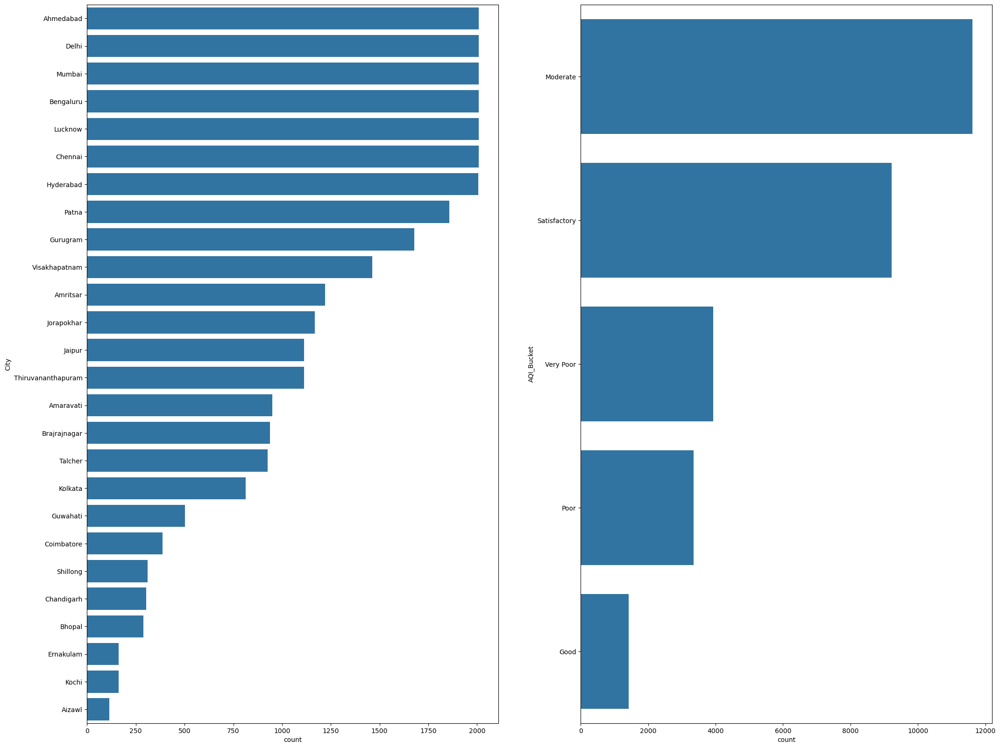

In [37]:
#Print Bar Chart for Cities and AQI_Bucket (Double-click to zoom in)

#Creating Figure and adjusting figure size
(fig, ax) = plt.subplots(1, 2, figsize=(25, 20))

#Creating Bar Chart of Counts for City 
sns.countplot(y = "City", data =New_City_Day_DF_Cap, 
              order = New_City_Day_DF_Cap['City'].value_counts().index,ax = ax[0] )
#Creating Bar Chart of Counts for AQI_Bucket 
sns.countplot(y = "AQI_Bucket", data =New_City_Day_DF_Cap, order = New_City_Day_DF_Cap['AQI_Bucket'].value_counts().index, ax = ax[1] )

In addition, a two-way frequency table can be utilised to compare the AQI_Bucket values for each city. This two-way frequency table can be seen below:

In [38]:
#Obtain two-way Frequency Table to compare AQI_Bucket entries for each city using pandas 'crosstab' function 
freq_table_City_Bucket = pd.crosstab(New_City_Day_DF_Cap['City'],New_City_Day_DF_Cap['AQI_Bucket'] ) 
freq_table_City_Bucket

AQI_Bucket,Good,Moderate,Poor,Satisfactory,Very Poor
City,,,,,
Ahmedabad,2,607,336,143,921
Aizawl,83,1,0,29,0
Amaravati,160,283,53,446,9
Amritsar,85,499,74,507,56
Bengaluru,115,676,54,1147,17
Bhopal,2,174,32,77,4
Brajrajnagar,16,555,154,172,41
Chandigarh,48,74,21,158,3
Chennai,12,881,129,964,23


Looking at the above data, particular points which stand out are the following:
1. No Very Poor AQI_Bucket values for Aizawl, Coimbatore, Ernakulam and Kochi
2. Very Poor is the most common AQI_Bucket entry for Ahmedabad and Delhi whilst majority of entries in Dataset were either moderate or satisfactory.
3. Moderate and Satisfactory were the most common entries for 22 out of 26 cities.


This data can also be represented using a set of Bar Charts

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:718: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


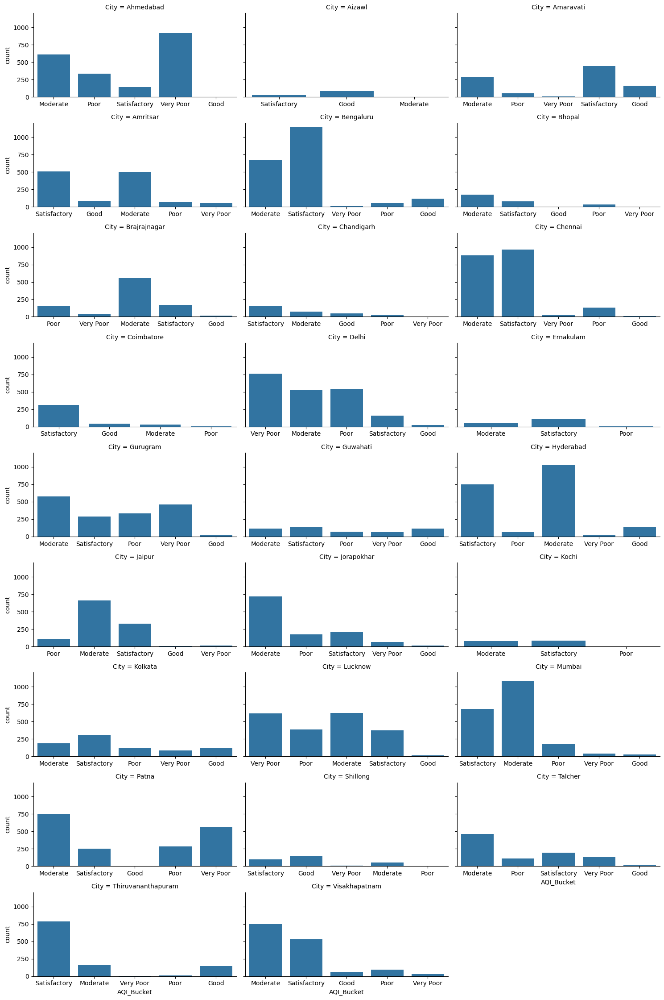

In [39]:
#Obtain One Bar Chart Per City highlighting the AQI_Bucket freuqncy distribution in each city
#Utilise FacetGrid to create a multi-plot grid (Height, Aspect ratio and number of charts per row all specified)
g = sns.FacetGrid(New_City_Day_DF_Cap, col="City", height=2.5, aspect =2,  col_wrap=3, sharex = False)
#Map AQI_Bucket values to each Facet subset
g.map(sns.countplot, "AQI_Bucket")

We will now proceed by discussing the results obtained for the non-numerical variables in our Dataset using the pandas 'describe' function. 

In [40]:
#Showing Descriptive Statistics for Numerical Variables 
Desc_Stats_Numerical

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000
mean,61.563067,115.275593,14.879484,27.194261,28.852563,21.374607,1.129356,11.843367,33.162925,2.042680,6.385914,2.310801,154.718835
std,41.238775,65.971369,12.307064,18.530274,20.792439,13.851517,0.900250,7.932523,18.933640,2.422214,6.332436,1.636527,95.742644
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.434654
25%,30.800000,66.507358,5.900000,12.750000,14.073296,11.002281,0.500000,5.930000,19.020000,0.100000,1.270000,1.182060,85.000000
50%,50.210000,101.271612,10.420000,22.594298,23.520000,18.340000,0.900000,9.590136,30.070000,1.049471,4.548409,2.075095,121.000000
75%,80.890362,150.750000,20.449771,36.830000,38.530000,28.840000,1.520000,15.327611,43.965000,3.150000,8.980000,3.130000,199.000000
max,156.025905,277.113962,42.274429,72.950000,75.215057,55.596578,3.050000,29.424027,81.382500,7.725000,20.545000,6.051909,370.000000


Additionally, the variance can be obtained by utilising 'pandas.DataFrame.var':


In [41]:
#Obtaining variance descriptive statistics
Variance = New_City_Day_DF_Cap.var(numeric_only = True)
#Creating Pandas DataFrame for Variance
Variance_PD = pd.DataFrame(Variance, columns = ['Variance'])
Variance_PD

,Variance
PM2.5,1700.636542
PM10,4352.221571
NO,151.463813
NO2,343.371070
NOx,432.325507
NH3,191.864510
CO,0.810450
SO2,62.924925
O3,358.482713
Benzene,5.867121


The Skewness can be obtained by utilising 'pandas.DataFrame.skew'

In [42]:
#Obtaining skewness descriptive statistics
Skewness = New_City_Day_DF_Cap.skew(numeric_only = True)
#Creating Pandas DataFrame for Skewness
Skewness_PD = pd.DataFrame(Skewness, columns = ['Skewness'])
Skewness_PD

,Skewness
PM2.5,0.987306
PM10,0.855131
NO,1.089024
NO2,0.958555
NOx,0.910882
NH3,0.875233
CO,0.902113
SO2,1.007049
O3,0.703780
Benzene,1.213638


The Kurtosis can be obtained by utilising 'pandas.DataFrame.kurtosis'

In [43]:
#Obtaining Kurtosis descriptive statistics
Kurt = New_City_Day_DF_Cap.kurtosis(numeric_only = True)
#Creating Pandas DataFrame for Kurtosis
Kurtosis_PD = pd.DataFrame(Kurt, columns = ['Kurtosis'])
Kurtosis_PD

,Kurtosis
PM2.5,0.067256
PM10,0.117701
NO,0.048429
NO2,0.156931
NOx,-0.049386
NH3,0.125623
CO,-0.104783
SO2,0.025761
O3,0.007062
Benzene,0.281315


To aid us in describing the above obtained values for Skewness and Kurtosis we will obtain Histogram plots for all our Pollutant and AQI variables. 

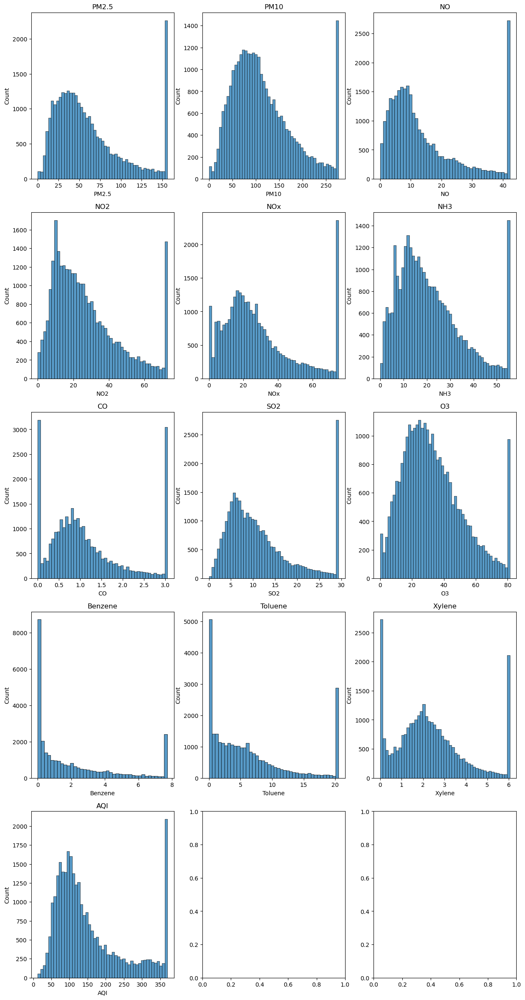

In [44]:
#Print Histogram plots for pollutant and AQI variables (Double-click to zoom in)

#Creating Figure and Set of Subplots (5*3 = 15 Figures for 13 Pollutant and AQI Variables) + Specifying Figure Size
(fig, axis) = plt.subplots(nrows=5, ncols=3, figsize=(15,30))

#Obtaining List of all Pollutant and AQI variables in Dataset
List_to_Plot = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']

#for loop going over all pollutant and AQI variables
for i in range(len(List_to_Plot)):
    #Using histplot function in seaborn, for each variable a histogram plot is created displaying the frequency of each variable
    #according to automatically generated bins. The axes each entry of i will be mapped to is also specified
    sns.histplot(data = New_City_Day_DF_Cap, x = List_to_Plot[i], bins='auto',ax=axis[i // 3, i % 3], legend = False)
    #Define label for each axis (To take name of Pollutant/AQI variable considered in i)
    axis[i // 3, i % 3].set_title(List_to_Plot[i])

Let us check each Pollutant and AQI variable one-by-one:
1. PM2.5 - A Skewness value of 0.987 implies that the data is moderately positively skewed. The mean of PM2.5 was 61.563 and indeed from the plot it can be seen that data is shifted to the left of the mean. A Kurtosis value of 0.067, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

2. PM10 -  A Skewness value of 0.855 implies that the data is moderately positively skewed. The mean of PM10 was 115.276 and indeed from the plot it can be seen that data is shifted somewhat left of this mean. A Kurtosis value of 0.118, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

3. NO - A Skewness value of 1.089 implies that the data is highly positively skewed. The mean of NO was 14.879 and indeed from the plot it can be seen that data is shifted significantly to the left of this mean. A Kurtosis value of 0.048, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

4. NO2 - A Skewness value of 0.959 implies that the data is moderately positively skewed. The mean of NO2 was 27.194 and indeed from the plot it can be seen that data is shifted somewhat to the left of this mean. A Kurtosis value of 0.157, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

5. NOx - A Skewness value of 0.911 implies that the data is moderately positively skewed. The mean of NOx was 28.853 and indeed from the plot it can be seen that data is shifted somewhat to the left of this mean. A Kurtosis value of -0.0493, signifies a negative kurtosis value which implies that data should be spread out across the entire range though this is not directly obvious from the Histogram plot.

6. NH3 - A Skewness value of 0.875 implies that the data is moderately positively skewed. The mean of NH3 was 21.375 and indeed from the plot it can be seen that data is shifted very slightly to the left of this mean. A Kurtosis value of 0.126, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

7. CO - A Skewness value of 0.902 implies that the data is moderately positively skewed. The mean of CO was 1.129 and indeed from the plot it can be seen that data is shifted slightly to the left of this mean. A Kurtosis value of -0.105, signifies a negative kurtosis value which implies that data should be spread out across the entire range which is visible from the Histogram plot.

8. SO2 - A Skewness value of 1.007 implies that the data is highly positively skewed. The mean of SO2 was 11.843 and indeed from the plot it can be seen that data is shifted to the left of this mean. A Kurtosis value of 0.026, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

9. O3 -  A Skewness value of 0.704 implies that the data is moderately positively skewed. The mean of O3 was 33.163 and indeed from the plot it can be seen that data is shifted just slightly to the left of this mean. A Kurtosis value of 0.007, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

10. Benzene -  A Skewness value of 1.214 implies that the data is strongly positively skewed. The mean of Benzene was 2.043 and indeed from the plot it can be seen that data is shifted to left of the mean mainly due to the significant number entries with a value of 0. A Kurtosis value of 0.281, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution though this is not particularly obvious from the Histogram plot.

11. Toluene -  A Skewness value of 1.094 implies that the data is strongly positively skewed. The mean of Toluene was 6.386 and indeed from the plot it can be seen that data is shifted to left of the mean mainly due to the significant number entries with a value of 0. A Kurtosis value of 0.124, signifies a positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution though this is not particularly obvious from the Histogram plot.

12. Xylene -  A Skewness value of 0.722 implies that the data is moderately positively skewed. The mean of Xylene was 2.311 and indeed from the plot it can be seen that data is shifted to the left of this mean. A Kurtosis value of 0.000426, signifies a barely positive kurtosis value which implies that data has a sharper peak around the mean when compared to a normal distribution.

13. AQI -  A Skewness value of 1.037 implies that the data is strongyl positively skewed. The mean of Xylene was 154.72 and indeed from the plot it can be seen that data is shifted to the left of this mean. A Kurtosis value of -0.047, signifies a negative kurtosis value which implies that data should be spread out across the entire range though this is not directly obvious from the Histogram plot.

Let us now proceed to obtain the range and Interquartile range values which pair well with the minimum, quartile 1, median, quartile 3 and maximum value obtained in Desc_Stats_Numerical DataFrame

The range can be calculated using the Desc_Stats DataFrame obtained previously.

In [45]:
#Obtaining Range descriptive statistics
Range = Desc_Stats.iloc[10] - Desc_Stats.iloc[6]
#Creating Pandas DataFrame for Range
Range_PD = pd.DataFrame(Range, columns = ['Range'])
Range_PD

,Range
City,NaN
Date,NaN
PM2.5,156.025905
PM10,277.113962
NO,42.274429
NO2,72.95
NOx,75.215057
NH3,55.596578
CO,3.05
SO2,29.424027


The interquartile range can also be calculated using the Desc_Stats DataFrame obtained previously.

In [46]:
#Obtaining IQR descriptive statistics
IQR = Desc_Stats.iloc[9] - Desc_Stats.iloc[7]
#Creating Pandas DataFrame for IQR
IQR_PD = pd.DataFrame(IQR, columns = ['Range'])
IQR_PD

,Range
City,NaN
Date,NaN
PM2.5,50.090362
PM10,84.242642
NO,14.549771
NO2,24.08
NOx,24.456704
NH3,17.837719
CO,1.02
SO2,9.397611


All of these Statistical tools can be represented by means of Box Plots.

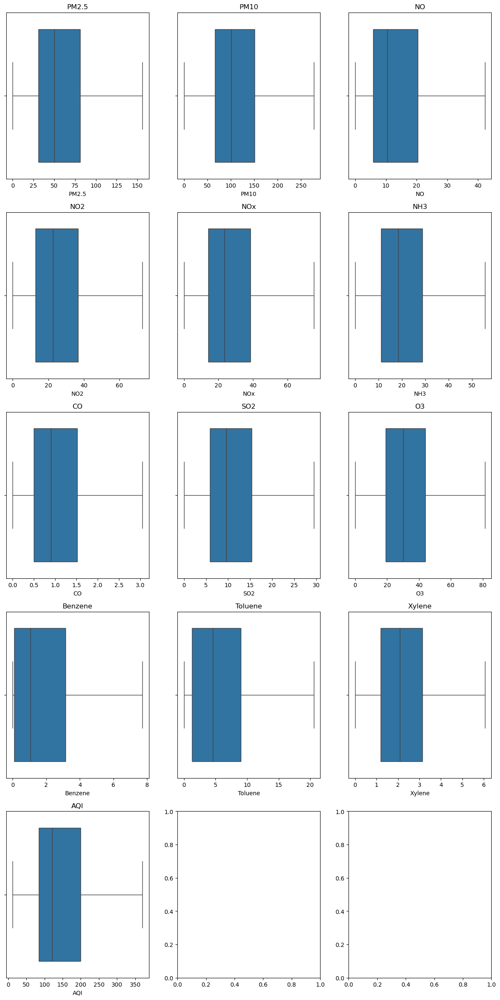

In [47]:
#Print Box plots for pollutant and AQI variables (Double-click to zoom in)

#Creating Figure and Set of Subplots (5*3 = 15 Figures for 13 Pollutant and AQI Variables) + Specifying Figure Size
(fig, axis) = plt.subplots(nrows=5, ncols=3, figsize=(15,30))

#Obtaining List of all Pollutant and AQI variables in Dataset
List_to_Plot = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']

#for loop going over all pollutant and AQI variables
for i in range(len(List_to_Plot)):
    #Using boxplot function in seaborn, for each variable a box plot is created
    sns.boxplot(data = New_City_Day_DF_Cap, x = List_to_Plot[i], orient = 'x',ax=axis[i // 3, i % 3])
    #Define label for each axis (To take name of Pollutant/AQI variable considered in i)
    axis[i // 3, i % 3].set_title(List_to_Plot[i])

<b> Visualize the distribution of AQI and the individual pollutants across the different cities

There are a total of 26 Cities, 12 Pollutant variables and 1 AQI variable. A total of $26 \times 13 = 338$ plots are required to visualize the distribtion of AQI and the individual pollutants across all the different cities. We will first attempt to show all the required Histogram Plots in one image with each row representing the distributions of AQI and the individual pollutants 

In [48]:
# Assuming you have columns for cities and five pollutants (e.g., pollutant1, pollutant2, pollutant3, pollutant4, pollutant5)
# Create a list of columns to include in the histogram
pollutants = ['AQI', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']


# Create subplots for each city
cities = New_City_Day_DF_Cap['City'].unique()
num_cities = len(cities)

fig, axes = plt.subplots(num_cities, len(pollutants), figsize=(50, 100))

for i, city in enumerate(cities):
    city_data = New_City_Day_DF_Cap[New_City_Day_DF_Cap['City'] == city]
    
    for j, pollutant in enumerate(pollutants):
        ax = axes[i, j]
        city_data[pollutant].plot.hist(ax=ax, bins=20)
        ax.set_title(f"{city} - {pollutant} Distribution")
        ax.set_xlabel("Value")
        ax.set_ylabel("Count")
        ax.grid(True)

plt.tight_layout()
plt.show()

Clearly the number of Historgam plots obtained is excessive. Instead, let us attempt to obtain the distribution of the AQI variable for all Cities in one figure.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


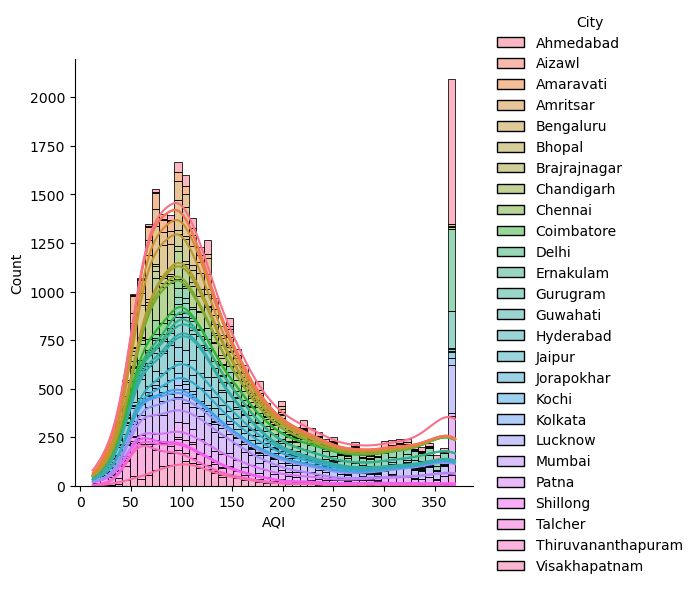

In [49]:
#In addition we can also plot one histogram plot to visualize the distribution of AQI across all different cities
sns.displot(New_City_Day_DF_Cap, x='AQI', hue='City', bins= 'auto', kind='hist', kde=True, multiple='stack')

While one figure is much easier to analyse than multiple figures, the AQI counts in each bin for all cities are all concentrated in one another thus still making it difficult to analyse the distribution accordingly.

Hence, let us attempt to make use of Ridgeline plots which are useful when the number of distribution groups is very high.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


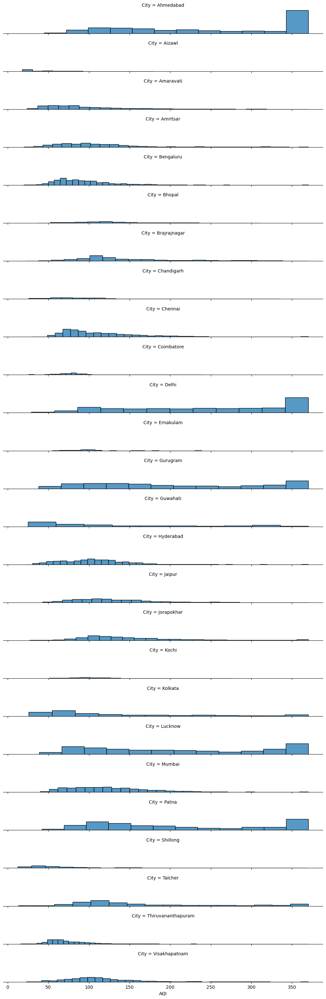

In [50]:
#Ridgeline Plot for AQI

RidgeLine_AQI = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_AQI.map_dataframe(sns.histplot, x="AQI")
#Removing Y-Axis Value Label
RidgeLine_AQI.set(yticks=[])
#Removing Y-Label
RidgeLine_AQI.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_AQI.despine(left=True)


Some Observations noted are the following:
1. Aizawl, Bhopal, Chandigarh, Coimbatore, Ernakulam, Guwahati, Kochi and Shillong have a very low number of AQI readings compared with other cities since the bars are barely visible (Same Y-Aixs,X-Axis scales are utilised for all plots) when compared to those for other cities. This is comparable with the frequency table obtained previously were the above mentioned cities have the lowest number of readings. 
2. Ahmedabad, Dehli, Gurugram, Lucknow and Patna all have a significant number of AQI readings with high values. However they also have a significant number of AQI readings in all gaps. Indeed, from the frequency table obtained previously all these cities contain a significantly large number of readings.
3. Continuing on point 2 Guwhati, Kolkata, Mumbai and Talcher all exhibt a range of values albeit it is less apart due to the lower number of readings.
4. Amaravati, Amritsar, Bengaluru, Bengaluru, Brajrajnagar, Chennai, Hyderabad, Jaipur, Jorapokhar, Thiruvananthapuram and Visakhapatnam all feature distributions concentrated at lower AQI values














C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


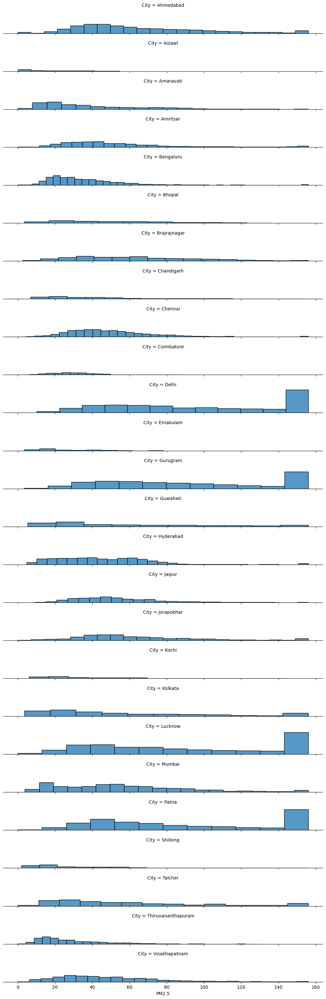

In [51]:
#Ridgeline Plot for PM2.5

RidgeLine_PM2 = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_PM2.map_dataframe(sns.histplot, x="PM2.5")
#Removing Y-Axis Value Label
RidgeLine_PM2.set(yticks=[])
#Removing Y-Label
RidgeLine_PM2.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_PM2.despine(left=True)


Some Observations noted are the following:

1. Dehli, Lucknow, Patna and Gurugram all have a significant number of PM2.5 readings with high values. All of these cities also had relatively high values of AQI. This can be expected since as described previously AQI is calculated only if either PM2.5 or PM10 readings are available implying there might be some innate relationship between the two variables. All of these variables are spread over a large range, however this can be attributed to the fact that all of these cities have a high number of readings.
2. Continuing on point 1, the PM2.5 values for Ahmedabad, Mumbai, Jorapokhar, Brajrajnagar,Talcher, Kolkata and Guwahati are all spread out. Guwhati, Kolkata, Mumbai and Talcher all had a large range of AQI values once again indicating an innate relationship between the two variables.
3. Amaravati, Amritsar, Bengaluru, Chennai, Hyderabad, Jaipur, Thiruvananthapuram and Visakhapatnam all feature distributions concentrated at lower PM2.5 values. All of these cities also had distibutions concentrated at lower AQI values





C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


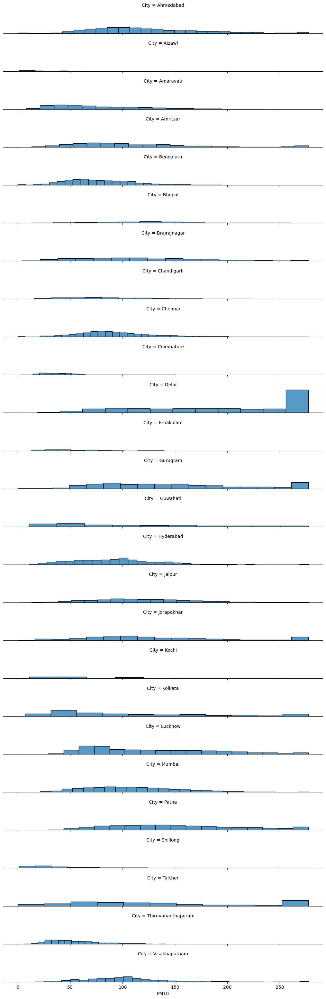

In [52]:
#Ridgeline Plot for PM10

RidgeLine_PM10 = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_PM10.map_dataframe(sns.histplot, x="PM10")
#Removing Y-Axis Value Label
RidgeLine_PM10.set(yticks=[])
#Removing Y-Label
RidgeLine_PM10.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_PM10.despine(left=True)


Some Observations noted are the following:

1. Dehli, Talcher and Gurugram all have a significant number of PM10 readings with high values. Dehli and Gurugram also had relatively high values of AQI. This can be expected since as described previously AQI is calculated only if either PM2.5 or PM10 readings are available implying there might be some innate relationship between the two variables. All of these variables are spread over a large range.
2. Continuing on point 1, the PM10 values for Ahmedabad, Mumbai, Lucknow, Patna, Amritsar, Jorapokhar, Jaipur,  Brajrajnagar,Talcher, Kolkata are all spread out.  However, Amristsar, Jorapokhar, Jaipur and Brajrajnagar all had a low range of AQI values implying that some other variable is responsible for the spread seen in the AQI distribution.
3.  Bengaluru, Chennai, Hyderabad, Thiruvananthapuram and Amaravati all feature distributions concentrated at lower PM2.5 values. All of these cities also had distibutions concentrated at lower AQI values.



C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


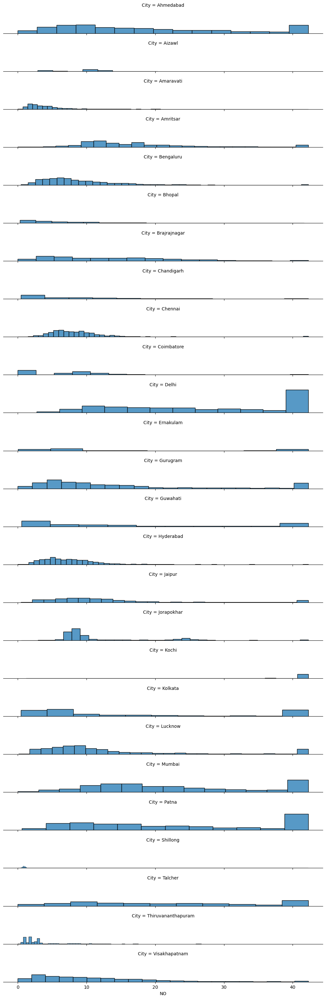

In [53]:
#Ridgeline Plot for NO

RidgeLine_NO = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_NO.map_dataframe(sns.histplot, x="NO")
#Removing Y-Axis Value Label
RidgeLine_NO.set(yticks=[])
#Removing Y-Label
RidgeLine_NO.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_NO.despine(left=True)



Some Observations noted are the following:

1. Ahmedabad, Dehli, Mumbai, Patna, Talcher and Kolkata all feature a significant number of high NO readings. While Kolkata features a significant number of high NO readings it should also be noted that the majority of its NO values are fairly low. In addition, Lucknow, Gurugram, Jaipur and Guwahati all feature all feature a chunk of high NO readings albeit not to the same affect as the six previously mentioned cities. In addition, from  these four cities Gurugram exhibts spread out NO values.

2. In addition, Amritsar has NO readings spread out over a large range. While Bengaluru, Chennai, Hyderbad, Visakhapatnam, Jorapokhar, Thiruvananthapuram, Amaravati and Brajrajnagar all have NO readings concentrated at low values.



C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


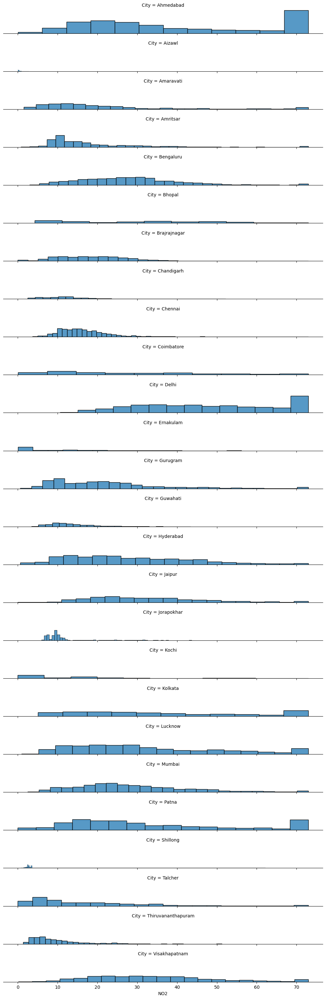

In [54]:
#Ridgeline Plot for NO2

RidgeLine_NO2 = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_NO2.map_dataframe(sns.histplot, x="NO2")
#Removing Y-Axis Value Label
RidgeLine_NO2.set(yticks=[])
#Removing Y-Label
RidgeLine_NO2.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_NO2.despine(left=True)




Some Observations noted are the following:

1. Ahmedabad, Delhi, Patna, Lucknow and Kolkata all feature a significant number of high NO2 values. In addition, all of these Cities have NO2 values are spread out over a large range.
2. In addition, Mumbai, Bengaluru, Hyderabad, Visakhapatnam and Jaipur all have their NO2 value spread out over a large ranges. Whilst, Chennai, Gurugram, Amritsar, Jorapokhar, Thiruvananthapuram, Amaravati, Brajrajnagar and Talcher all have NO2 readings concentrated at low values.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


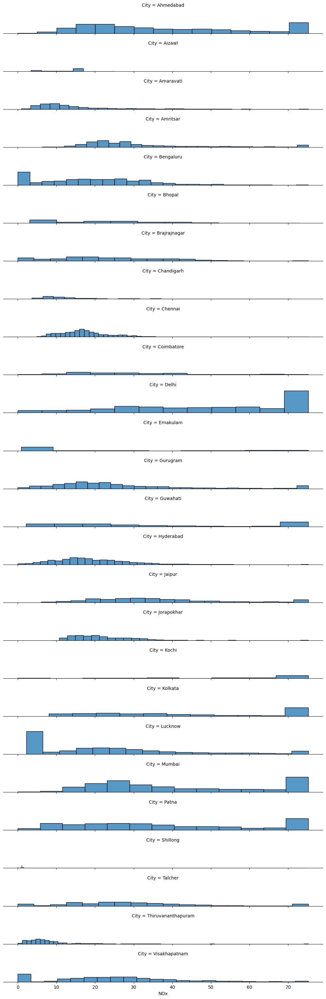

In [55]:
#Ridgeline Plot for NOx

RidgeLine_NOx = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_NOx.map_dataframe(sns.histplot, x="NOx")
#Removing Y-Axis Value Label
RidgeLine_NOx.set(yticks=[])
#Removing Y-Label
RidgeLine_NOx.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_NOx.despine(left=True)




Some Observations noted are the following:

1. Ahmedabad, Delhi, Mumbai, Patna and Kolkata all feature a high number of NOx readings at/close to the maximum NOx value recorded. In addition, all of these Cities have NOx values are spread out over a large range. 

2. On the otherhand, Bengaluru, Lucknow and Visakhapatnam all feature a high number of NOx readings at/close to the minimum NOx value recorded. However these three cities all exhibt N0x value spread out over a large range.

3. In addition, Jaipur and Talcher both have NO2 value spread out over a large ranges. Whilst, Chennai, Hyderabad, Gurugram, Amritsar, Jorapokhar, Thiruvananthapuram, Amaravati and Brajrajnagar all have NOx readings concentrated at low values.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


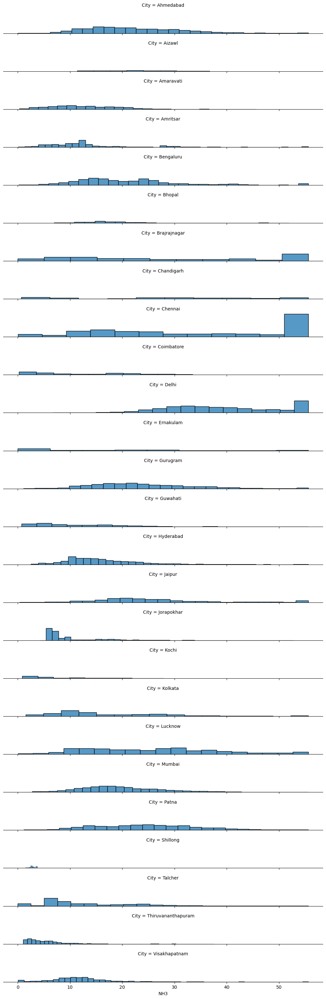

In [56]:
#Ridgeline Plot for NH3

RidgeLine_NH3 = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_NH3.map_dataframe(sns.histplot, x="NH3")
#Removing Y-Axis Value Label
RidgeLine_NH3.set(yticks=[])
#Removing Y-Label
RidgeLine_NH3.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_NH3.despine(left=True)





Some Observations noted are the following:

1. Delhi, Chennai and Brajrajnagar have a significant number of NH3 readings at/close to the maximum NH3 value recorded. All three cities however had NH3 readings spread over a range of values.

3. Ahmedabad, Mumbai, Bengaluru, Lucknow, Patna, Gurugram and Jaipur have NH3 readings spread over a large range of values. On the otherhand Hyderabad, Visakhapatnam, Amritsar, Jorapokhar, Thiruvananthapuram, Amaravati, Talcher and Kolkota have NH3 readings concentrated at low values.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


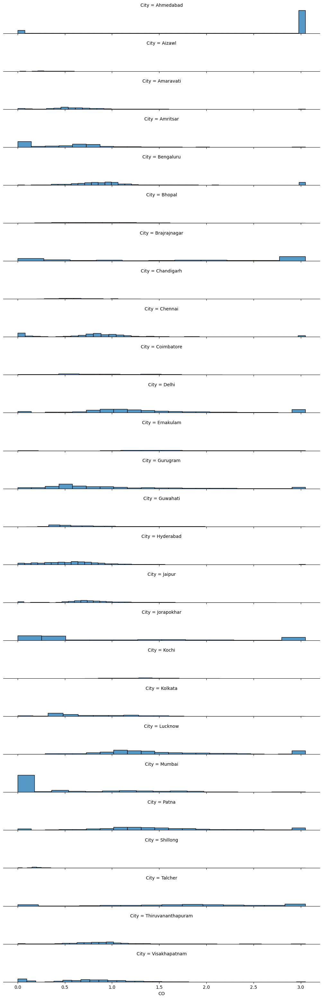

In [57]:
#Ridgeline Plot for CO

RidgeLine_CO = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_CO.map_dataframe(sns.histplot, x="CO")
#Removing Y-Axis Value Label
RidgeLine_CO.set(yticks=[])
#Removing Y-Label
RidgeLine_CO.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_CO.despine(left=True)





Some Observations noted are the following:

1. Ahmedabad is an intresteing case whereby the majority of CO readings are at/close to the maximum CO values recorded. Aditionlly any remaining CO readings are at/close to the minimum CO values recorded. Jorapokhar AND Brajrajnagar also exhibt a similar distribution placement albeit to a lesser extent.

2. Delhi, Bengaluru, Chennai and Gurugram have a significant number of CO readings at/close to the maximum CO value recorded. However, remaining readings are concentrated at low CO values.

3. Mumbai, Hyderabad, Visakhapatnam, Amritsar, Jaipur, Thiruvananthapuram, Amaravati and Kolkata all fearure CO readings concetrated at low values. Meanwhile, Lucknow, Patna and Talcher feature CO radings over a wide range of values.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


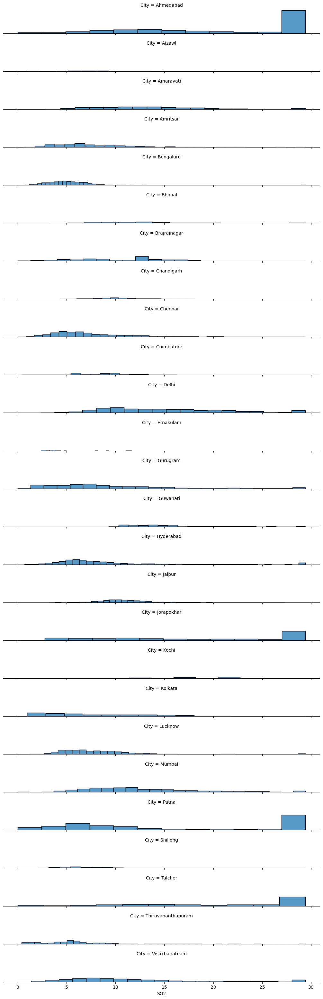

In [58]:
#Ridgeline Plot for SO2

RidgeLine_SO2 = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_SO2.map_dataframe(sns.histplot, x="SO2")
#Removing Y-Axis Value Label
RidgeLine_SO2.set(yticks=[])
#Removing Y-Label
RidgeLine_SO2.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_SO2.despine(left=True)







Some Observations noted are the following:

1. Ahmedabad, Patna, Jorapokhar and Talcher all feature a significant number of SO2 values at a fairly high value. It should be noted however that the remaining S02 readings for Patna are concentrated at low SO2 values.

2. In addition, Delhi, Mumbai, Visakhapatnam, Amaravati and Brajrajnagar have SO2 readings spread out over a large range. In comparison to Bengaluru, Lucknow, Chennai, Hyderabad, Gurugram, Amritsar, Thiruvananthapuram and Kolkata which have SO2 readings concentrated at low values.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


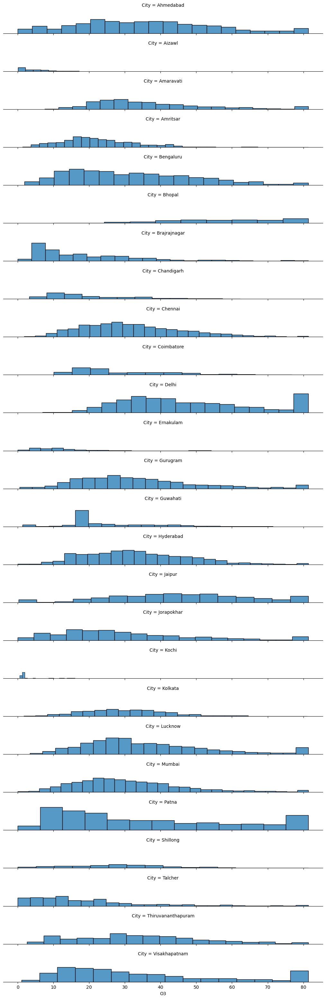

In [59]:
#Ridgeline Plot for O3

RidgeLine_O3 = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_O3.map_dataframe(sns.histplot, x="O3")
#Removing Y-Axis Value Label
RidgeLine_O3.set(yticks=[])
#Removing Y-Label
RidgeLine_O3.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_O3.despine(left=True)








Some Observations noted are the following:

1. Ahmedabad, Delhi, Mumbai, Bengaluru, Lucknow, Chennai, Hyderabad, Patna, Gurugram, Visakhapatnam, Jorapokhar, Jaipur, Thiruvananthapuram and Amaravati all feature 03 readings spread over a large range. From these cities, only Dehli has a number of O3 readings with the highest frequncy at the maximum interval.

2. Amritsar, Brajrajnagar, Talcher and Kolkata are the only cities which feature O3 readings concentrated at low values.

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


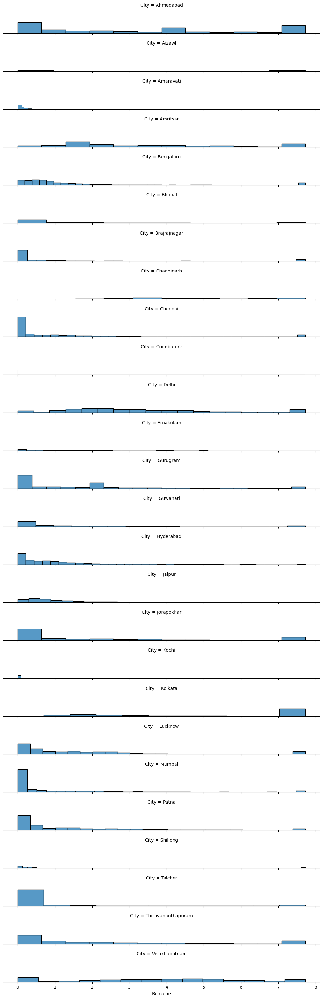

In [60]:
#Ridgeline Plot for Benzene

RidgeLine_Benzene = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_Benzene.map_dataframe(sns.histplot, x="Benzene")
#Removing Y-Axis Value Label
RidgeLine_Benzene.set(yticks=[])
#Removing Y-Label
RidgeLine_Benzene.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_Benzene.despine(left=True)


Some Observations noted are the following:

1. A majority of cities feature a significant portion of Benzene readings at very low values. Mumbai,Bengaluru, Lucknow, Chennai, Hyderabad, Patna, Gurugram, Jorapokhar, Jaipur, Thiruvananthapuram, Amaravati, Brajrajnagar and Talcher all have the majority of their Benzene readings at some of the lowest values possible. Ahmedabad also features a significant number of readings at low values however a number of Benzene readings for this city are also of a very high value.


2. Apart from Ahmedabad, only Delhi, Visakhapatnam and Amritsar feature Benzene readings over a wide range of values. 

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


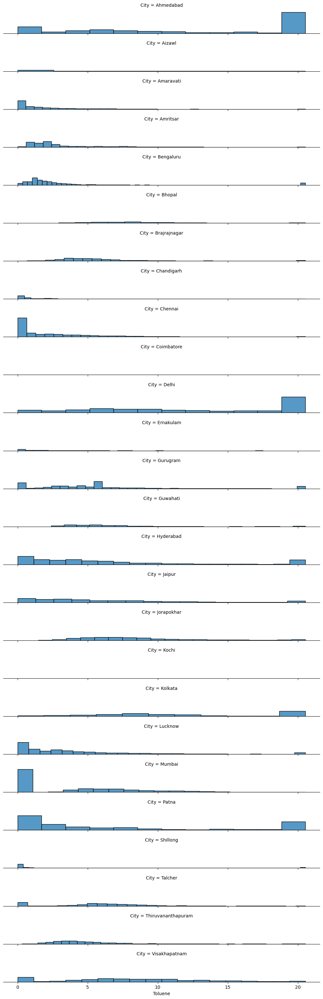

In [61]:
#Ridgeline Plot for Toluene

RidgeLine_Toluene = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_Toluene.map_dataframe(sns.histplot, x="Toluene")
#Removing Y-Axis Value Label
RidgeLine_Toluene.set(yticks=[])
#Removing Y-Label
RidgeLine_Toluene.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_Toluene.despine(left=True)


Some Observations noted are the following:

1. Ahmedabad and Dehli have a significant number of Toulene readings at/close to the maximum Toulene value recorded. In addition, these two cities also have a non-insignificant number of Toulene readings at/close to the minimum Toulene value recorded. Patna exhibts a similar distribution however Toulene readings at/close to the minimum value exceed those at/close to the maximum Toulene value.

2. Kolkota has a significant number of Toulene readings at/close to the maximum Toulene value recorded. On the otherhand, Mumbai, Lucknow, Chennai, Visakhapatnam, Amaravati and Talcher all have a significant number of readings at/close to the minimum Toulene value recorded. In addition the latter 6 cities all have Toulene readings cooncentrated at low values.


C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


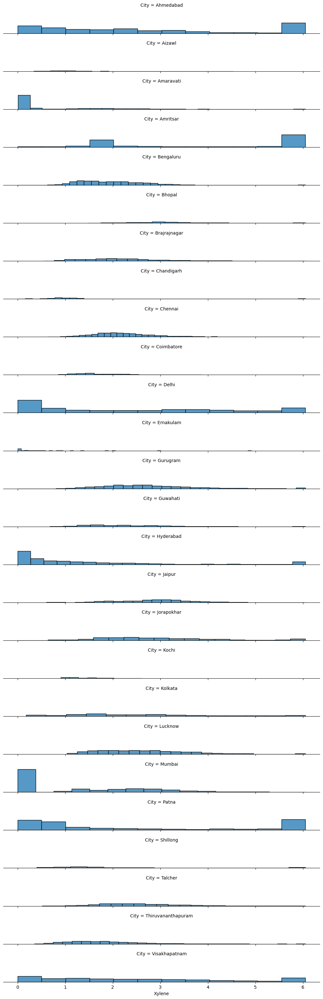

In [62]:
#Ridgeline Plot for Xylene

RidgeLine_Xylene = sns.FacetGrid(New_City_Day_DF_Cap, row="City", aspect = 9, height = 1.2)
RidgeLine_Xylene.map_dataframe(sns.histplot, x="Xylene")
#Removing Y-Axis Value Label
RidgeLine_Xylene.set(yticks=[])
#Removing Y-Label
RidgeLine_Xylene.set(ylabel=None)
#Removing Y-Axis Line
RidgeLine_Xylene.despine(left=True)

Some Observations noted are the following:

1. Ahmedabad and Patna all feature a significant portion of Xylene readings at low and high value. This implies that it significant chnages in Xylene readings might be a common occurance in these two cities.
2. Dehli, Mumbai and Amaravati all feature a number of low value Xylene readings. Amaravati in particular, has almost no Xylene readings exceeding 0.5.
3. Amritsar features a significant number of high value Xylene readings, however remaining readings are concentrated at low values.
4. From the remaining cities, Bengaluru, Chennai, Thiruvananthapuram, Brajrajnagar, Talcher and Kolkata feature Xylene readings concentrated at low values. On the otherhand, Lucknow, Gurugram, Jorapokhar, Jaipur feature Xylene readings concentrated at high values.

## Task 3 - Correlation Analysis (15 Marks)

<b> Analyse the correlation between the pollutant features and the AQI.


A variable is said to be continuous if it can take any value within a given interval [28]. In our DataSet all Pollutant feature values are given up to 2 Decimal Places, however depending on the type of intruments used or measurement techniques deployed more accuracte measurements could be obtained. As a result, all pollutant features in our data are continuous variables. On the otherhand, AQI is an ordered discrete variable. However, as discussed previously when applying imputation using Multiple linear regression we had considered AQI  as a continuous variable due to its large number of categories. Therefore to analyse the correlation between pollutant features and AQI we will make use of the Pearson product moment correlation which is suitable when analysing correlations between two continuous variables [26]. In addition, we will also analyse the correlation between poullutant features and AQI_Bucket (an extension of AQI) using the Spearman rank-order correlation which is suitable for attempting to analyse correlations between one continuous variable and an ordinal variable. 


Our code will proceed as follows:
1. Create a copy of the Dataset obtained in Task 1 (Following missing value imputation and outlier detection). This copy will be names 'DataSet_Correlation' and will be used exclusively for Correlation Analysis.
2. The categorical entries under the AQI_Bucket variable will be transformed into numerical values.
3. Remove all Non-Numerical rows ('City' and 'Date') from 'DataSet_Correlation'
4. Obtain Pearson Correlation Coefficient for Pollutants against AQI
5. Obtain P-Value of Pearson Correlation Coefficient (Test for Signficance)
6. Display scatter plots of the top two and bottom two pollutants according to the correlation coefficient value obtained.
7. Repeat step 4-6 using Spearman rank-order correlation to test Pollutants against AQI_Bucket

In [63]:
#Create copy of Capped Dataset
DataSet_Correlation = New_City_Day_DF_Cap.copy()

In [64]:
#Obtain List of Unique values in AQI_Bucket Variable (To be used to assign numerical scale)
DataSet_Correlation['AQI_Bucket'].unique()

array(['Moderate', 'Poor', 'Satisfactory', 'Very Poor', 'Good'],
      dtype=object)

In [65]:
#Assign numerical scale to AQI_Bucket Variable
#Good = 0 ; Satisfactory = 1; Moderate = 2; Poor = 3; Very Poor = 4
DataSet_Correlation['AQI_Bucket'].replace(['Good', 'Satisfactory', 'Moderate', 'Poor', 'Very Poor'],
                        [0, 1, 2, 3, 4], inplace = True)

In [66]:
#Remove Non-Numerical Columns ('City' and 'Date')
#NB: numerical_only=Bool can be used in pd.corr() however this requires an updated version of pandas
DataSet_Correlation.drop(['City','Date'], axis = 1, inplace = True)

<b> Correlation between Pollutant Features and AQI

<Axes: >

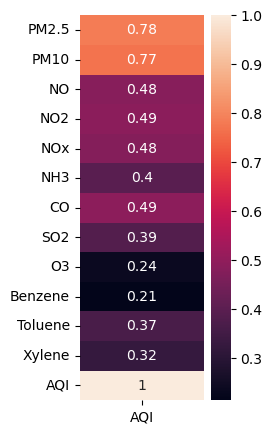

In [67]:
#Making use of 'pandas.DataFrame.corr' to obtain Pearson Correlation Coefficient
#Obtain Corrlation between pollutant features and the AQI

#Correlation of all variables (Using Pearson)
Correlation_Complete = DataSet_Correlation.corr(method = 'pearson', min_periods = 1)

#Obtain Corrlation between pollutant features and the AQI by taking last column of the correlation matrix of all variables 
#Last row is removed since correlation between AQI and AQI_Bucket is not relevant
Correlation_AQI = Correlation_Complete.iloc[:-1,-2:-1]

#Adjust Size of Plot
plt.figure(figsize=(2, 5))

#Correlation with Heatmap between pollutant features and the AQI
sns.heatmap(Correlation_AQI, annot=True)

What pearson correlation figure represents a stong, moderate or weak correlation is subjective. Let us take the scale shown in [29], where it is stated that:
1. A correlation >= 0.80 implies a very strong linear correlation
2. A correlation >= 0.60 but < 0.80 implies a strong linear correlation
2. A correlation >= 0.4 but < 0.6 implies a moderate linear correlation
3. A correlation >=0.2 but <0.4 implies a weak linear correlation
4. A correlation <0.2 implies a very weak linear correlation

From the above range of values we can note that only PM2.5 and PM10 have a strong linear correlation with AQI. Meanwhile S02, O3, Benzene, Toulene and Xylene have a weak linear correlation with AQI. The remaining variables (NO, NO2, NOx, NH3 and CO) have a moderate linear correlation with AQI.

Let us now check if the pearson correlation coefficients obtained above are significant. The Null/Alternative hypothesis when testing for significance are the following [26]:
1. Null Hypothesis ($H_{0}$) - The two variables are not linearly related
2. Alternative Hypothesis ($H_{1}$) - There is a significant linear relationship between the two variables

In [68]:
#Create List_Of_Polluters to be compared with AQI
List_of_Polluters = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']

#Empty Lists to Store Correlation Coefficients & P-Values
Correlation_Coefficient = []
P_Value = []

#for loop going over list_of_polluters defined above
for i in range(len(List_of_Polluters)):
    #Carry out pearson correlation between AQI and some polluter
    Result = stats.pearsonr(DataSet_Correlation['AQI'],DataSet_Correlation[List_of_Polluters[i]])
    #Append Correlation Coefficient result to Correlation_Coefficient list
    Correlation_Coefficient.append(Result[0])
    #Append p-value result to P_Value list
    P_Value.append(Result[1])
    
#Define Data to be used to Build DataFrame        
Data = {'Polluter': List_of_Polluters, 'Correlation Coefficient with AQI': Correlation_Coefficient, 'P-Value': P_Value}
#Create DataFrame
DataFrame = pd.DataFrame(data = Data)
#Sort DataFrame in Descending Order
DataFrame.sort_values(by = 'Correlation Coefficient with AQI', ascending = False, inplace = True)
#Call DataFrame
DataFrame

,Polluter,Correlation Coefficient with AQI,P-Value
0,PM2.5,0.784848,0.000000e+00
1,PM10,0.766950,0.000000e+00
6,CO,0.492959,0.000000e+00
3,NO2,0.488980,0.000000e+00
2,NO,0.482309,0.000000e+00
4,NOx,0.477623,0.000000e+00
5,NH3,0.395964,0.000000e+00
7,SO2,0.385796,0.000000e+00
10,Toluene,0.367184,0.000000e+00
11,Xylene,0.324957,0.000000e+00


When considering a 5% risk of type I error, it can be seen that all correlations obtained are significant. Let us now compare the scatter plots between PM2.5 and PM10 (Both Variables have a strong linear correlation with AQI) against AQI and that of O3 and Benzene (Both Variables have a weak linear correlation with AQI).

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


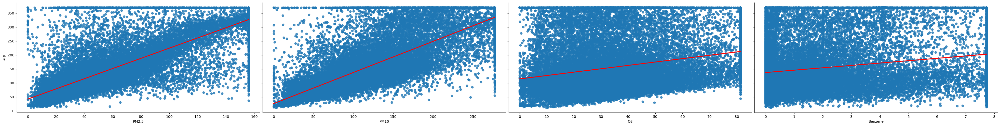

In [69]:
#Plot Correlation plot for AQI against PM2.5, PM10 (Highest Correlation) and Benzene (Lowest Correlation) 
#Double-Click to Zoom-In 
sns.pairplot(DataSet_Correlation, x_vars = ['PM2.5','PM10','O3','Benzene'], y_vars = ['AQI'], height=5, aspect=2,
            kind="reg", plot_kws={'line_kws':{'color':'red'}})

As PM2.5 and PM10 increase, AQI values seem to increase. However, as O3 and Benzene increase on a small upward change in AQI value can be seen. The linear red line helps show this relationship further.

<b> Correlation between Pollutant Features and AQI_Bucket

<Axes: >

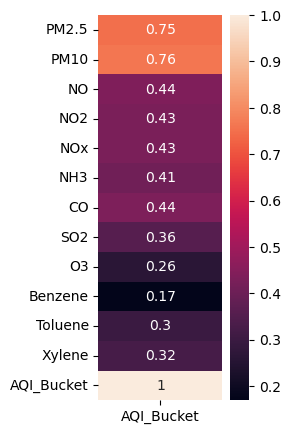

In [70]:
#Obtain Correlation between Pollutant Features and AQI Bucket

#Correlation of all variables
Correlation_Complete = DataSet_Correlation.corr(method = 'spearman', min_periods = 1)
#Obtain Corrlation between pollutant features and the AQI 
#by taking last column of the correlation matrix of all variables
Correlation_AQI = Correlation_Complete.iloc[[0,1,2,3,4,5,6,7,8,9,10,11,13],-1:]
#Adjust Size of Plot
plt.figure(figsize=(2, 5))
#Correlation with Heatmap between pollutant features and the AQI_Bucket
sns.heatmap(Correlation_AQI, annot=True)

The Spearman's rank correlation coefficient is used to measure the strength of a monotonic relationship between variables [30]. A monotonic relationship implies that the dependent variable never decreases as its independent variable increases or vice-versa. Similar to Pearson correlation, what spearman correlation figure represents a stong, moderate or weak monotonic correlation is subjective. Let us take the scale shown in [29], where it is stated that:
1. A correlation >= 0.80 implies a very strong monotonic correlation
2. A correlation >= 0.60 but < 0.80 implies a strong monotonic correlation
2. A correlation >= 0.4 but < 0.6 implies a moderate monotonic correlation
3. A correlation >=0.2 but <0.4 implies a weak monotonic correlation
4. A correlation <0.2 implies a very weak monotonic correlation

From the above range of values we can note that only PM2.5 and PM10 have a strong monotnic correlation with AQI_Bucket. On the opposite end of the spectrum Benzene has a very weak monotnic correlation with AQI_Bucket. S02, O3, Toulene and Xylene have a weak monotonic correlation with AQI. The remaining variables (NO, NO2, NOx, NH3 and CO) have a moderate monotonic correlation with AQI.

Let us now check if the spearman correlation coefficients obtained above are significant. The Null/Alternative hypothesis when testing for significance are the following [26]:
1. Null Hypothesis ($H_{0}$) - There is no monotonic correlation
2. Alternative Hypothesis ($H_{1}$) - There is a monotonic correlation

In [71]:
#Create List_Of_Polluters to be compared with AQI_Bucket
List_of_Polluters = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']

#Empty Lists to Store Correlation Coefficients & P-Values
Correlation_Coefficient = []
P_Value = []

#for loop going over list_of_polluters defined above
for i in range(len(List_of_Polluters)):
    #Carry out Spearman rank correlation between AQI_Bucket and some polluter
    Result = stats.spearmanr(DataSet_Correlation['AQI_Bucket'],DataSet_Correlation[List_of_Polluters[i]])
    #Append Correlation Coefficient result to Correlation_Coefficient list
    Correlation_Coefficient.append(Result[0])
    #Append p-value result to P_Value list
    P_Value.append(Result[1])
    
#Define Data to be used to Build DataFrame    
Data = {'Polluter': List_of_Polluters, 'Correlation Coefficient with AQI_Bucket': Correlation_Coefficient, 'P-Value': P_Value}
#Create DataFrame
DataFrame = pd.DataFrame(data = Data)
#Sort DataFrame in Descending Order
DataFrame.sort_values(by = 'Correlation Coefficient with AQI_Bucket', ascending = False, inplace = True)
#Call DataFrame
DataFrame

,Polluter,Correlation Coefficient with AQI_Bucket,P-Value
1,PM10,0.760601,0.000000e+00
0,PM2.5,0.748521,0.000000e+00
2,NO,0.436842,0.000000e+00
6,CO,0.435334,0.000000e+00
4,NOx,0.428937,0.000000e+00
3,NO2,0.427261,0.000000e+00
5,NH3,0.408115,0.000000e+00
7,SO2,0.356075,0.000000e+00
11,Xylene,0.323691,0.000000e+00
10,Toluene,0.297176,0.000000e+00


When considering a 5% risk of type I error, it can be seen that all monotonic correlations obtained are significant. Let us now compare the scatter plots between PM2.5 and PM10 (Both Variables have a strong monotnic correlation with AQI_Bucket) against AQI_Bucket and that of O3 and Benzene (Both Variables have a weak linear correlation with AQI_Bucket).

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


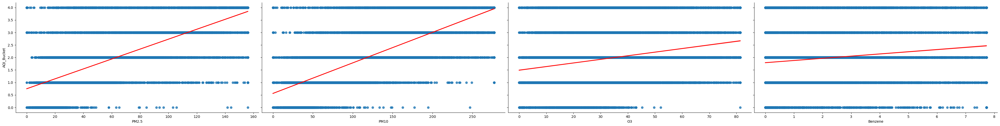

In [72]:
#Plot Correlation plot for AQI_Bucket against PM2.5, PM10 (Highest Correlation) and Benzene (Lowest Correlation) 
#Recall AQI_Bucket values are the following: #Good = 0 ; Satisfactory = 1; Moderate = 2; Poor = 3; Very Poor = 4
#Double-Click to Zoom-In 
sns.pairplot(DataSet_Correlation, x_vars = ['PM2.5','PM10','O3','Benzene'], y_vars = ['AQI_Bucket'], height=5, aspect=2,
            kind="reg", plot_kws={'line_kws':{'color':'red'}})

While the number of data points makes it diffcult to tell, a monotonic relationship can be seen when PM2.5 and PM10 to AQI_Buckets. Taking an AQI_Bucket value of 0 (Good = 0) as an example, there is a higher concentration of low PM2.5 and PM10 values. For O3 and Benzene this phenomena is also apparant albeit to a much lesser degreee.

<b> Analyse the correlations between the pollutant features and other pollutant features. You can use appropriate visualization if you think it helps.

We will now attempt to analyse the correlation between the pollutant features and other pollutant features. As described previously, all pollutant feactures are continuous and therefore the Pearson product moment correlation can be utilized to obtain the pearson correlation coefficients.  

Our code will proceed as follows:
1. Obtain a Heatmap displaying the correlations between the pollutant features and other pollutant features.
2. Obtain P-Value of Pearson Correlation Coefficients (Test for Signficance)
3. Display scatter plots of the most and least correlated variables.

<Axes: >

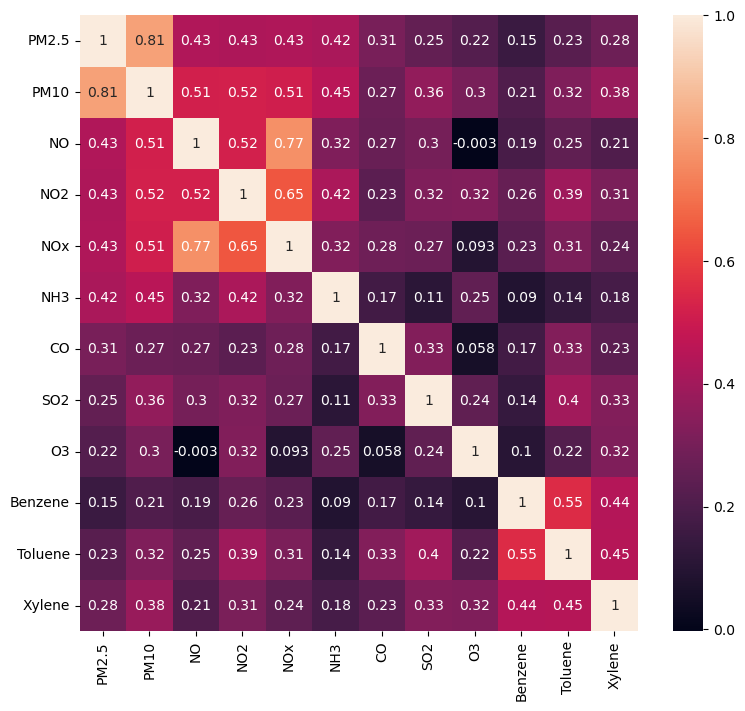

In [73]:
#Obtain Corrlation between Pollutant Features

#Correlation of all variables
Correlation_Complete = DataSet_Correlation.corr(method = 'pearson', min_periods = 1)
#Obtain Corrlation between pollutant features (excluding AQI)
#by removing last column and last row of the correlation matrix of all variables
Correlation_AQI = Correlation_Complete.iloc[:-2,:-2]
#Adjust Size of Plot
plt.figure(figsize=(9, 8))
#Correlation with Heatmap between pollutant features 
sns.heatmap(Correlation_AQI, annot=True)

In [74]:
#Create Complete List of Pollutants under investigation
List_of_Polluters = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene']

#Empty Lists to Store the Dependent Pollutant, Independent Pollutant for the current iteration 
#and the corresponding Coefficient and P-Values
Correlation_Coefficient_Pol = []
P_Value_Pol = []
Variable = []
CorrelatedWith = []

#for loop going over list of polluters
for i in range(len(List_of_Polluters)):
    #for loop once again going over list of polluters
    for j in range(len(List_of_Polluters)):
        #Carry out Pearson Correaltion between one polluter (defined by i) and another polluter (defined in j)
        Result = stats.pearsonr(DataSet_Correlation[List_of_Polluters[i]],DataSet_Correlation[List_of_Polluters[j]])
        #Append Independent Polluter Variable
        Variable.append(List_of_Polluters[i])
        #Append Dependent Polluter Variable
        CorrelatedWith.append(List_of_Polluters[j])
        #Append Corresponding Correlation Coefficient
        Correlation_Coefficient_Pol.append(Result[0])
        #Append Corresponding P-Value
        P_Value_Pol.append(Result[1])
        
#Define Data to be used to Build DataFrame    
Data = {'Polluter Under Investigation': Variable,
        'Correlated With': CorrelatedWith,
        'Correlation Coefficient': Correlation_Coefficient_Pol,
        'P-Value': P_Value_Pol}
#Create DataFrame
DataFrame = pd.DataFrame(data = Data)
#Sort DataFrame in Descending Order by Correaltion Coefficient
DataFrame.sort_values(by = 'Correlation Coefficient', ascending = False, inplace = True)
#Define DataFrames Representing different brackets of Correlation Coefficient Values
#DataFrame_Ex1 excludes correlations between a pollutant and itself
DataFrame_Ex1 = DataFrame[DataFrame['Correlation Coefficient'] < 0.999]
DataFrame_Very_Strong = DataFrame_Ex1[DataFrame_Ex1['Correlation Coefficient'] >= 0.80]
DataFrame_Strong = DataFrame_Ex1[(DataFrame_Ex1['Correlation Coefficient'] >= 0.60) & (DataFrame_Ex1['Correlation Coefficient'] < 0.80)]
DataFrame_Moderate = DataFrame_Ex1[(DataFrame_Ex1['Correlation Coefficient'] >= 0.40) & (DataFrame_Ex1['Correlation Coefficient'] < 0.60)]
DataFrame_Weak = DataFrame_Ex1[(DataFrame_Ex1['Correlation Coefficient'] >= 0.20) & (DataFrame_Ex1['Correlation Coefficient'] < 0.4)]
DataFrame_Very_Weak = DataFrame_Ex1[(DataFrame_Ex1['Correlation Coefficient'] < 0.2)]
#Define DataFrame representing non-significant correlations 
DataFrame_P5 = DataFrame[DataFrame['P-Value'] > 0.05]


The following Variables exhibt a very strong linear correlation among themselves (Correlation Coefficient > 0.80).

In [75]:
#Call DataFrame_Very_Strong
DataFrame_Very_Strong

,Polluter Under Investigation,Correlated With,Correlation Coefficient,P-Value
12,PM10,PM2.5,0.808305,0.0
1,PM2.5,PM10,0.808305,0.0


The following Variables exhibt a strong linear correlation among themselves (0.60 <= Correlation Coefficient < 0.80).

In [76]:
#Call DataFrame_Strong
DataFrame_Strong

,Polluter Under Investigation,Correlated With,Correlation Coefficient,P-Value
50,NOx,NO,0.772347,0.0
28,NO,NOx,0.772347,0.0
51,NOx,NO2,0.645097,0.0
40,NO2,NOx,0.645097,0.0


The following Variables exhibt a moderate linear correlation among themselves (0.40 <= Correlation Coefficient < 0.60).

In [77]:
#Call DataFrame_Moderate
DataFrame_Moderate

,Polluter Under Investigation,Correlated With,Correlation Coefficient,P-Value
129,Toluene,Benzene,0.549436,0.0
118,Benzene,Toluene,0.549436,0.0
15,PM10,NO2,0.520564,0.0
37,NO2,PM10,0.520564,0.0
38,NO2,NO,0.520368,0.0
27,NO,NO2,0.520368,0.0
25,NO,PM10,0.514818,0.0
14,PM10,NO,0.514818,0.0
49,NOx,PM10,0.511710,0.0
16,PM10,NOx,0.511710,0.0


The following Variables exhibt a weak linear correlation among themselves (0.20 <= Correlation Coefficient < 0.40).

In [78]:
#Call DataFrame_Weak
DataFrame_Weak

,Polluter Under Investigation,Correlated With,Correlation Coefficient,P-Value
127,Toluene,SO2,0.398833,0.000000e+00
94,SO2,Toluene,0.398833,0.000000e+00
46,NO2,Toluene,0.389447,0.000000e+00
123,Toluene,NO2,0.389447,0.000000e+00
133,Xylene,PM10,0.380147,0.000000e+00
...,...,...,...,...
128,Toluene,O3,0.216187,2.625979e-309
21,PM10,Benzene,0.208267,1.017904e-286
109,Benzene,PM10,0.208267,1.017904e-286
35,NO,Xylene,0.205115,5.518943e-278


The following Variables exhibt a very weak linear correlation among themselves (Correlation Coefficient < 0.20). In case of any negative correlations these will also be captured.

In [79]:
#Call DataFrame_Very_Weak
DataFrame_Very_Weak

,Polluter Under Investigation,Correlated With,Correlation Coefficient,P-Value
110,Benzene,NO,0.188791,4.747559e-235
33,NO,Benzene,0.188791,4.747559e-235
137,Xylene,NH3,0.182685,5.698344e-220
71,NH3,Xylene,0.182685,5.698344e-220
81,CO,Benzene,0.171935,1.042825e-194
114,Benzene,CO,0.171935,1.042825e-194
66,NH3,CO,0.169877,4.680190e-190
77,CO,NH3,0.169877,4.680190e-190
108,Benzene,PM2.5,0.150940,5.145389e-150
9,PM2.5,Benzene,0.150940,5.145389e-150


In addition, when considering a 5% risk of type I error, it can be seen that all the following variables have an insignficant linear correlation among themselves.

In [80]:
#Calling DataFram_P5
DataFrame_P5

,Polluter Under Investigation,Correlated With,Correlation Coefficient,P-Value
32,NO,O3,-0.003007,0.605386
98,O3,NO,-0.003007,0.605386


Let us now compare the scatter plots between PM2.5 and PM10 (Both Variables have a strong linear correlation between themselves) and that of O3 and NO (Both Variables have a very weak and insignificant linear correlation between themselves).

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


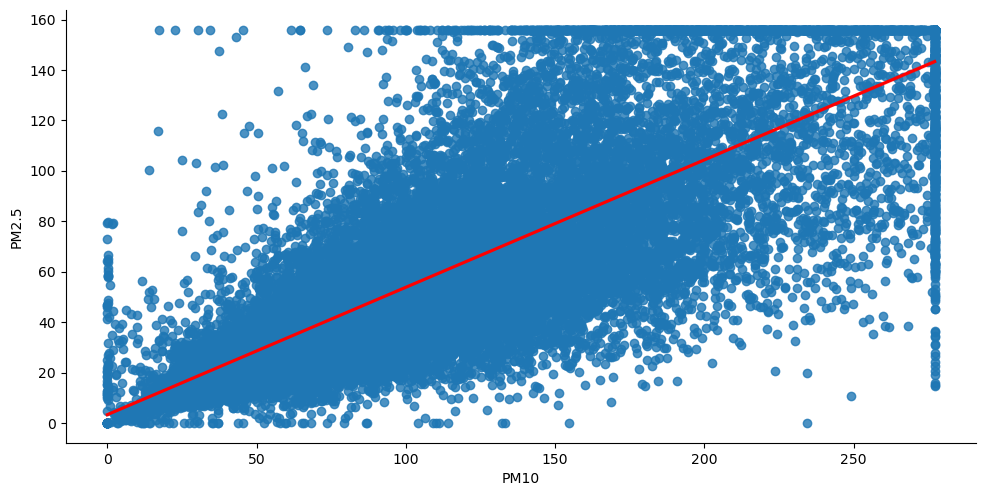

In [81]:
#Plot Correlation plot for AQI against PM2.5, PM10 (Highest Correlation) and Benzene (Lowest Correlation)
sns.pairplot(DataSet_Correlation, x_vars = ['PM10'], y_vars = ['PM2.5'], height=5, aspect=2,
            kind="reg", plot_kws={'line_kws':{'color':'red'}})

C:\Users\Owner\anaconda3\envs\EX_CCE5108_FINAL\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


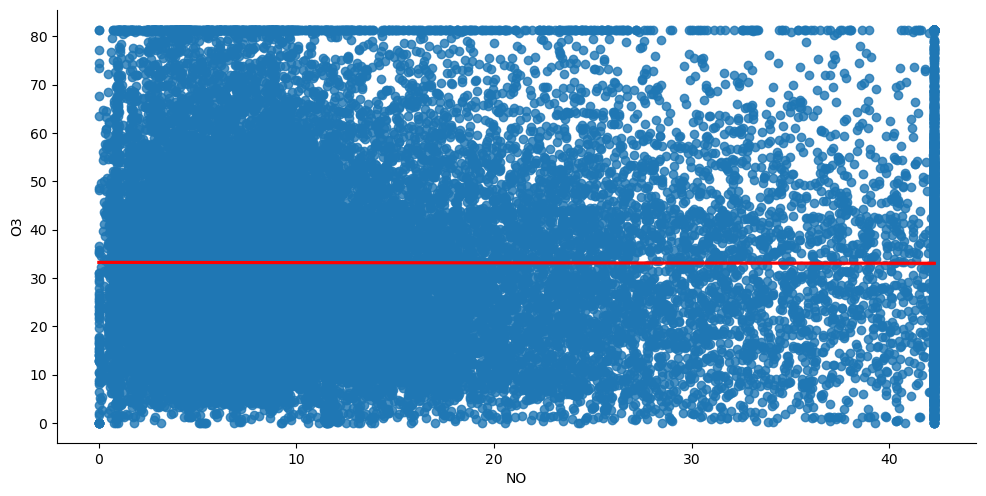

In [82]:
#Plot Correlation plot for AQI against PM2.5, PM10 (Highest Correlation) and Benzene (Lowest Correlation)
sns.pairplot(DataSet_Correlation, x_vars = ['NO'], y_vars = ['O3'], height=5, aspect=2,
            kind="reg", plot_kws={'line_kws':{'color':'red'}})

It is clear that as PM2.5 increases, PM10 is also increasing thus signifying a very strong linear correlation. On the otherhand, no such phenomena is present between NO and O3.

## Task 4 - Time Series Analysis (15 Marks)


+ <b> Select three cities and analyse the time series data of the AQI for the selected cities. (Selecting cities with different trends is better than selecting cities with the same trends if possible.)
+ <b> Describe any patterns and trends you observe.

From Task 2, we are aware that there are a total of six cities who collected data for the entire timeframe i.e. A total 2009 readings spanning from 01/01/2015 up to 01/07/2020. These six cities are:
1. Ahmedabad
2. Delhi
3. Mumbai
4. Bengaluru
5. Lucknow
6. Chennai

To be able to analyse extensive time series data, the three cities required will be obtained from these six cities. 

We will first proceed by computing the synchrony (correlation) for the AQI time series of these six cities. The three least correlated time series will be selected, in hopes of selected cities with different trends.

Our code proceeds as follows:
1. Create a copy of the DataFrame and set Date column as index.
2. Select only City and AQI columns from this DataFrame
3. Transform DataFrame into a DatFrame containing six columns. Each column represents the AQI value for one of the six cities.
4. Calculate Pearson Correlation Coefficient of Transformed DataFrame (Present using Heatmap)

In [83]:
#Create Data Frame of 'New_City_Day_DF_Cap' with Date as Index
Time_Series_DF = New_City_Day_DF_Cap.set_index('Date')

In [84]:
#Select Only Relevant Columns in Time_Series_DF
Time_Series_DF = Time_Series_DF[['City','AQI']]

In [85]:
#Filter DataFrame to include only 6 cities with complete time series
List_Of_Cities = ['Ahmedabad', 'Delhi', 'Mumbai', 'Bengaluru', 'Lucknow', 'Chennai']

#Create An Empty DataFrame with the same indices as 'Time_Series_DF'
Time_Series_Complete = pd.DataFrame(columns = [], 
                   index = Time_Series_DF.loc[Time_Series_DF['City'] == List_Of_Cities[0]].index)

#for loop going over list of 6 cities
for i in range(len(List_Of_Cities)):
    #Select only rows beloning to a city dictated by value of i
    Time_Series_DF2 = Time_Series_DF.loc[Time_Series_DF['City'] == List_Of_Cities[i]]
    #Take AQI column of 1 city DataFrame and rename it to 'City'_AQI
    Time_Series_DF2 = Time_Series_DF2[['AQI']].rename(columns = {"AQI": List_Of_Cities[i] + '_AQI'})
    #Append this AQI column to a new DataFrame
    Time_Series_Complete = pd.concat([Time_Series_Complete, Time_Series_DF2], axis = 1)

<Axes: >

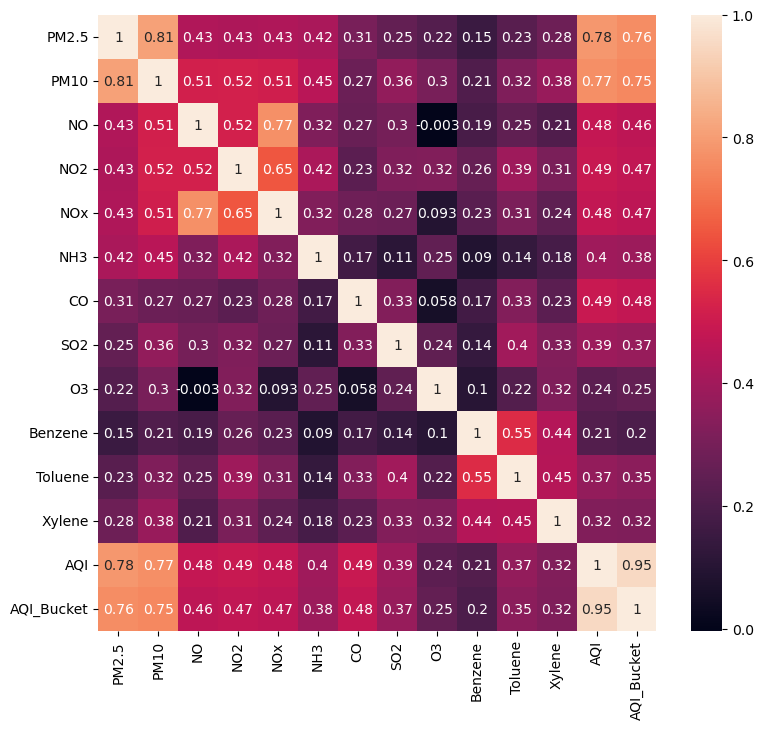

In [86]:
#Obtain Heatmap of Correlation between time series data of AQI for six cities

#Correlation of all variables
Correlation_TS = Time_Series_Complete.corr(method = 'pearson', min_periods = 1, numeric_only = True)
#Adjust Size of Plot
plt.figure(figsize=(9, 8))
#Correlation with Heatmap between AQI time series of different cities
sns.heatmap(Correlation_Complete, annot=True)

Clearly from these six cities, the AQI time series of some cities are correlated with each other whilst others are not. In particular Ahmedabad does not seem to be correlated with any city. Let us test for significance to further make up our mind.

In [87]:
#Create a list of the AQI values for six cities to iterate over
List_of_Cities = ['Ahmedabad_AQI', 'Delhi_AQI', 'Mumbai_AQI', 'Bengaluru_AQI', 'Lucknow_AQI', 'Chennai_AQI']

#Empty Lists to Store the Dependent City, Independent City for the current iteration 
#and the corresponding Coefficient and P-Values
Correlation_Coefficient_City = []
P_Value_City = []
Variable = []
CorrelatedWith = []

#for loop going over list of AQI values for different cities
for i in range(len(List_of_Cities)):
    #for loop going over list of AQI values for different cities
    for j in range(len(List_of_Cities)):
        #Carry out Pearson Correaltion between one city (defined by i) and another city (defined in j)
        Result = stats.pearsonr(Time_Series_Complete[List_of_Cities[i]],Time_Series_Complete[List_of_Cities[j]])
        #Append Independent City
        Variable.append(List_of_Cities[i])
        #Append Dependent City
        CorrelatedWith.append(List_of_Cities[j])
        #Append Corresponding Correlation Coefficient 
        Correlation_Coefficient_City.append(Result[0])
        #Append Corresponding P-Value
        P_Value_City.append(Result[1])

#Define Data to be used to Build DataFrame
Data = {'City AQI Value Under Investigation': Variable,
        'Correlated With': CorrelatedWith,
        'Correlation Coefficient': Correlation_Coefficient_City,
        'P-Value': P_Value_City}

#Create DataFrame
DataFrame = pd.DataFrame(data = Data)
#Sort in Ascending Order By Correlation Coefficient
DataFrame.sort_values(by = 'Correlation Coefficient', ascending = True, inplace = True)
#Create DataFrame Containing only insignificant Correlations (Taking a 1% risk of type I error)
DataFrame_Insig = DataFrame[DataFrame['P-Value'] > 0.01]

In [88]:
#Recall DataFrame_Insig
DataFrame_Insig

,City AQI Value Under Investigation,Correlated With,Correlation Coefficient,P-Value
3,Ahmedabad_AQI,Bengaluru_AQI,-0.046079,0.038908
18,Bengaluru_AQI,Ahmedabad_AQI,-0.046079,0.038908
1,Ahmedabad_AQI,Delhi_AQI,0.010662,0.632928
6,Delhi_AQI,Ahmedabad_AQI,0.010662,0.632928
4,Ahmedabad_AQI,Lucknow_AQI,0.025746,0.248716
24,Lucknow_AQI,Ahmedabad_AQI,0.025746,0.248716


From above DataFrame output it can be seen that AQI time series for Ahmedabad has an insignificant correlation (1% risk of type I error) with Bengaluru, Dehli and Lucknow. Hence, we will select Ahmedabad and two of Bengaluru, Dehli and Lucknow which are least correlated with each other.

In [89]:
#Recall DataFrame
DataFrame

,City AQI Value Under Investigation,Correlated With,Correlation Coefficient,P-Value
5,Ahmedabad_AQI,Chennai_AQI,-0.060964,6.268827e-03
30,Chennai_AQI,Ahmedabad_AQI,-0.060964,6.268827e-03
2,Ahmedabad_AQI,Mumbai_AQI,-0.060485,6.690659e-03
12,Mumbai_AQI,Ahmedabad_AQI,-0.060485,6.690659e-03
3,Ahmedabad_AQI,Bengaluru_AQI,-0.046079,3.890794e-02
18,Bengaluru_AQI,Ahmedabad_AQI,-0.046079,3.890794e-02
1,Ahmedabad_AQI,Delhi_AQI,0.010662,6.329276e-01
6,Delhi_AQI,Ahmedabad_AQI,0.010662,6.329276e-01
4,Ahmedabad_AQI,Lucknow_AQI,0.025746,2.487158e-01
24,Lucknow_AQI,Ahmedabad_AQI,0.025746,2.487158e-01


From above DataFrame output we have the following correlations:
AQI Bengaluru with AQI Dehli - 0.216640
AQI Bengaluru with AQI Lucknow - 0.172655
AQI Lucknow with AQI Dehli - 0.736163

The AQI time series of Bengaluru and the AQI time series of Lucknow have the lowest correlation among themselves. 
<b> Hence the three cities to be selected are Ahmedabad, Bengaluru and Lucknow

In [90]:
#Obtain DataFrame with only the three selected cities ( Ahmedabad, Bengaluru and Lucknow)
Time_Series_Selected = Time_Series_Complete[['Ahmedabad_AQI','Bengaluru_AQI','Lucknow_AQI']]

We will now proceed to analyse the time series data of the AQI for Ahmedabad, Bengaluru and Lucknow. To do so we will plot three time series charts (one for each city). 

In conjucntion with the time series, data a line representing a 30-day Simple Moving Average of that time series will be added to these charts. This 30-day Simple Moving Average will provide a smoother interpretation of our time series data and hence it will help us to identify any trends. Trends will be easier to identify using this 30-day simple moving average since the impact of random, short-term fluctuations in AQI values will be dimnished [31]

Our code will proceed as follows:
1. The 30-day Simple Moving Average will be calculated for the AQI time series of each of the three cities.
2. Three plots will be created once for each AQI City Time Series

In [91]:
#Calculating and appending 30-Day Simple Moving Averages results to our DataFrame
Time_Series_Selected['Ahmedabad_AQI_30D_MAVG'] = Time_Series_Selected.iloc[:,0].rolling(window=30).mean() #Missing 675
Time_Series_Selected['Bengaluru_AQI_30D_MAVG'] = Time_Series_Selected.iloc[:,1].rolling(window=30).mean() # Missign only 99
Time_Series_Selected['Lucknow_AQI_30D_MAVG'] = Time_Series_Selected.iloc[:,2].rolling(window=30).mean() #Missing 116 (At Beginning)

C:\Users\Owner\AppData\Local\Temp\ipykernel_24748\3293735071.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Time_Series_Selected['Ahmedabad_AQI_30D_MAVG'] = Time_Series_Selected.iloc[:,0].rolling(window=30).mean() #Missing 675
C:\Users\Owner\AppData\Local\Temp\ipykernel_24748\3293735071.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Time_Series_Selected['Bengaluru_AQI_30D_MAVG'] = Time_Series_Selected.iloc[:,1].rolling(window=30).mean() # Missign only 99


In [92]:
#Set Dates back to column to produce better plots
Time_Series_Selected.reset_index(inplace=True)

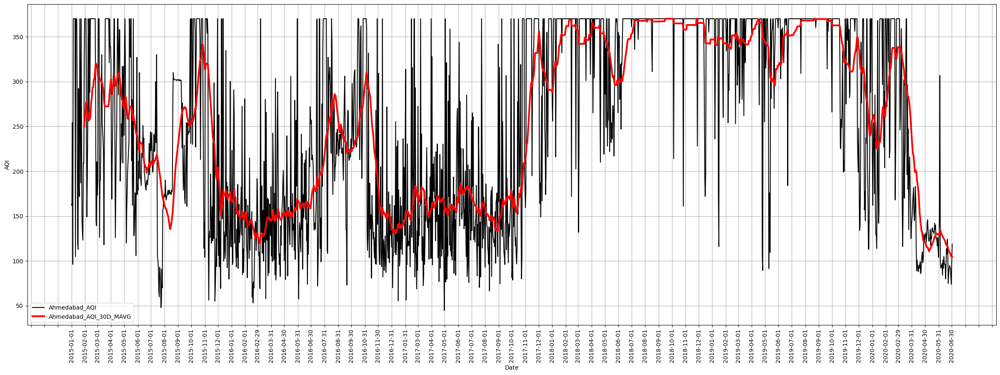

In [93]:
#Plotting AQI time series for Ahmedabad (Double Click to Zoom in)

#Create Plot and Specifying Plot Size
plt.figure(figsize=(30,10))
#Labeling X-Axis
plt.xlabel('Date')
#Labeling Y-Axis
plt.ylabel('AQI')

# Plotting AQI Time Series against the Date column
ax1 = plt.plot(Time_Series_Selected['Date'], Time_Series_Selected['Ahmedabad_AQI'], color='black', label='Ahmedabad_AQI')
# Plotting the 30-Day Simple Moving Average against the Date column
ax2 = plt.plot(Time_Series_Selected['Date'], Time_Series_Selected['Ahmedabad_AQI_30D_MAVG'], color='red', linewidth=3, label='Ahmedabad_AQI_30D_MAVG')

# Create a custom date locator for every one months
months = mdates.MonthLocator(interval=1)
ax = plt.gca()
ax.xaxis.set_major_locator(months)
plt.xticks(rotation=90)

#Hid Grid
plt.grid(True)
#Show Legend
plt.legend()
#Show Plot
plt.show()

From the Ahmedabad time series and with the help of the 30-day simple moving average we can observe the following trends and patterns:
1. From January 2015 up until around November 2017, AQI value remained well below the maximum AQI value recorded. However from November 2017 until October of 2019, AQI levels were generaly significantly higher constantly reaching the maximum AQI value recorded for Ahmedabad.
2. To continue with point 1, from November 2019 onwards AQI levels decreased dramatically reaching particularly low levels from March 2020 onwards. These low AQI levels could be explained by the Coronavirus virus which was declared a pandemic on the 11th of March 2020 [32]

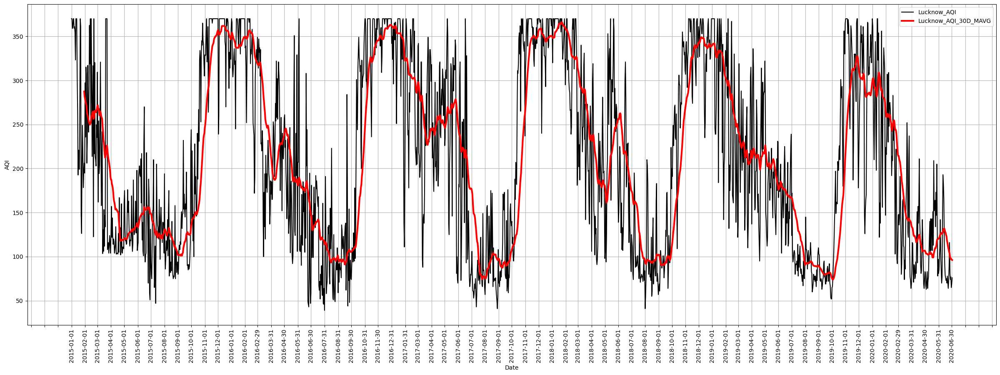

In [94]:
#Plotting AQI time series for Lucknow (Double Click to Zoom in)

import matplotlib.dates as mdates


#Create Plot and Specifying Plot Sixe
plt.figure(figsize=(30,10))
#Labeling X-Axis
plt.xlabel('Date')
#Labeling Y-Axis
plt.ylabel('AQI')

# Plotting AQI Time Series against the Date column
ax1 = plt.plot(Time_Series_Selected['Date'], Time_Series_Selected['Lucknow_AQI'], color='black', label='Lucknow_AQI')
# Plotting the 30-Day Simple Moving Average against the Date column
ax2 = plt.plot(Time_Series_Selected['Date'], Time_Series_Selected['Lucknow_AQI_30D_MAVG'], color='red', linewidth=3, label='Lucknow_AQI_30D_MAVG')

# Create a custom date locator for every one months
months = mdates.MonthLocator(interval=1)
ax = plt.gca()
ax.xaxis.set_major_locator(months)
plt.xticks(rotation=90)

#Hid Grid
plt.grid(True)
#Show Legend
plt.legend()
#Show Plot
plt.show()

From the above Lucknow AQI time series and with the help of the 30-day simple moving average we can observe the following trends and patterns:
1. The affect of the Covid-19 pandemic on AQI values is not apparent since there are multiple points in time with similar AQI values as March 2020 onwards
2. There seems to be some form of yearly pattern in the data. Indeed High AQI values generally start around October of every year and start dropping around March of the following year. This is followed by a period of relatively low values. To check if this pattern is truly yearly let us test the autocorrelation of the above time series against different lag values.

<b> NB: In other words we will be checking the correlation of the time series against itself but set at a different point in time. This correlation will be carried out with lag values of 30 up to 500, therefore the time series will be compared to itself a 30 days ahead and up to 500 days ahead. The day at which maximum correlation occurs will then be selected to check if this is close to 365 days or 1 year thus confirming the presence of a yearly pattern.

In [95]:
#List of Iterations Equivalent to number of days
itera = []
#Autocorrelation Values
result = []
#for loop going over lag values for pandas 'autocorr' function
for i in range(30,500):
    #carrying out autocorrelation using pandas 'autocorr' function
    autocorr = Time_Series_Selected['Lucknow_AQI'].autocorr(i)
    #append iteration values
    itera.append(i)
    #append autocorrelation result
    result.append(autocorr)

#Set up data fro dataframe
d = {'Day': itera, 'Correlation': result}
#Create DataFrame
df = pd.DataFrame(data=d)
#Select Maximum Correlation and Corresponding Day
max_x = df.loc[df['Correlation'].idxmax()]
#Print Day and Corresponding Maximum Correlation
print(max_x)

Day            369.000000
Correlation      0.703258
Name: 339, dtype: float64


Maximum Correlation occurs after 369 days which is very close to 365 days or 1 year. Hence, the pattern visible in the above time series seems to be occuring on a yearly basis.

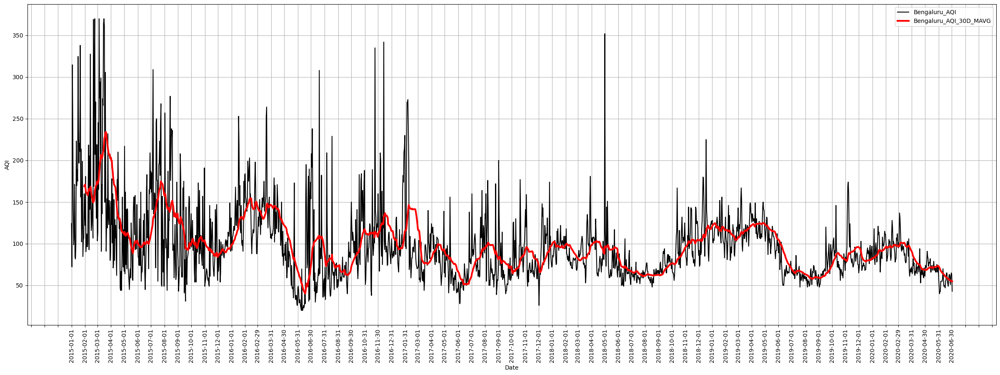

In [96]:
#Plotting AQI time series for Bengaluru (Double Click to Zoom in)

import matplotlib.dates as mdates


#Create Plot and Specifying Plot Sixe
plt.figure(figsize=(30,10))
#Labeling X-Axis
plt.xlabel('Date')
#Labeling Y-Axis
plt.ylabel('AQI')

# Plotting AQI Time Series against the Date column
ax1 = plt.plot(Time_Series_Selected['Date'], Time_Series_Selected['Bengaluru_AQI'], color='black', label='Bengaluru_AQI')
# Plotting the 30-Day Simple Moving Average against the Date column
ax2 = plt.plot(Time_Series_Selected['Date'], Time_Series_Selected['Bengaluru_AQI_30D_MAVG'], color='red', linewidth=3, label='Bengaluru_AQI_30D_MAVG')

# Create a custom date locator for every one months
months = mdates.MonthLocator(interval=1)
ax = plt.gca()
ax.xaxis.set_major_locator(months)
plt.xticks(rotation=90)

#Hid Grid
plt.grid(True)
#Show Legend
plt.legend()
#Show Plot
plt.show()


From the above Bengaluru AQI time series and with the help of the 30-day simple moving average we can observe the following trends and patterns:
1. AQI values seem to be decreasing over time. The time series never again attains the trend peak witnessed in the beginning of 2015. Albeit some individual values do come close.
2. The affect of the Covid-19 pandemic is not apparent due to the alread low AQI levels generally recorded in Bengaluru

## Task 5 - Conclusions (10 Marks)

+ <b> Comment on the overall trends you observed.

From the time series data of three cities (Ahmedabad, Bengaluru and Lucknow), the covid-19 pandameic had a significant impact on the AQI levels of one Ahmedabad. However, in 2019 a National Clean Air programme was started in india with aims of improving AQI values [33]. Two cities (Ahmedabad and Lucknow) are listed by this programme as cities which should attempt to improve their AQI levels. This could be the reason why a decrease in AQI values for Ahmedabad was seen starting from October 2019 and not just the begining of the covid pandemic.

+ <b> Describe any insights obtained from the data analysis.



The significant correlation between PM2.5 and PM10 is apparent particular when analysing the results obtain in Task 3 (Correlation Analysis) therefore it comes to no surprise to learn that AQI is only calculated if figures for either PM2.5 and PM10 are available [2]

Benzene is not utilised to calculate the AQI value [2] hence the low pearson correlation obtained between Benzene and AQI in task 3 comes at no surprise.





+ <b> Comment on what you think would be the most effective way to
improve AQI. Justify your answer with reference to the data and to the
visualizations you have produced.

In Task 3, strong correlations between Pm2.5 with AQI (Correlation = 0.78)  and PM10 (Correlation = 0.77) with AQI were obtained. Thus, any measure taken to reduce the concentration of both pollutants will improve AQI values. In addition, PM2.5 and PM10 also exhibted a strong correlation between each other (Correlation = 0.81). Hence, a measure decreasing one of the variables will lead to a decrease in the other.

In task 4, we obtained time series plots of the AQI for three different cities. The AQI time series plot for Ahmedabad it was seen that the Covid-19 pandemic led to a significant decrease in AQI values. This could be explained by measurements imposed at the time restricting the ability/need for movement resulting in less pollution. Similar sustainable measurements can be used to keep AQI levels low.

+ <b> Comment on possible improvements that may be made, or what further
data analysis and visualizations you would perform if you had more
time.

In Task 1 I utilized Multiple linear regression to impute any missing values. This imputation technique was carried out in a process similar to the  'IterativeImputer' function available in sklearn. This function however carries out multiple iterations whilst my code only carried out one iteration. A possible improvement would be to adjust the code to run multiple iterations.

In addition, the implimentation of Multiple Linear regression in my code can be improved by adjusting for multicolinearity between independent variables at each iteration (Such as when PM2.5 and PM10 are used as independent variables).

Data imputation can also be improved by imputing only pollutant variables and utilising these values to calculate any missing AQI values. The python code which utilises some pollutant variables to accurately calculate AQI is available in [2]

Adjustments could also be made to the outlier detection model since the 'Severe' value in the AQI_Bucket variable was completly removed following the application of 'Winsorization'. Possibly other outlier detection methods could provide more satisfactory results.

Finally, box plots could have been utilised to describe the distribution of AQI and the individual pollutants across the different cities in Task 3. This is since, describing distributions using ridge plots proved to be fairly difficult.

## References

[1] L. Cai and Y. Zhu, “The Challenges of Data Quality and Data Quality Assessment in the Big Data Era”, Data Science Journal, vol. 14, no. 0, p. 2, 2015.DOI: https://doi.org/10.5334/dsj-2015-002


[2] Rohan Rao, "Air Quality Data in India," Kaggle, 2023, [https://www.kaggle.com/datasets/rohanrao/air-quality-data-in-india]


[3] "Central Pollution Control Board," https://cpcb.nic.in/. [Online]. Available: [Date of Access: 20th October 2023].


[4]Rohan Rao, "Calculating AQI (Air Quality Index) Tutorial," in Kaggle, [https://www.kaggle.com/code/rohanrao/calculating-aqi-air-quality-index-tutorial]. [Online]. Available: [Date of Access: 20th October 2023].


[5] Rohan Rao, "Dataset Discussion: Air Quality Data in India," in Kaggle, [https://www.kaggle.com/datasets/rohanrao/air-quality-data-in-india/discussion/152785]. [Online]. Available: [Date of Access: 20th October 2023].


[6] "Computation of the Pollutant Standards Index (PSI)," in Haze Management, [https://www.haze.gov.sg/docs/default-source/faq/computation-of-the-pollutant-standards-index-%28psi%29.pdf]. [Online]. Available: [Date of Access: 20th October 2023].


[7] C. Billionnet, D. Sherrill, and I. Annesi-Maesano, “Estimating the Health Effects of Exposure to Multi-Pollutant Mixture,” vol. 22, no. 2, pp. 126–141, 2012, doi: 10.1016/j.annepidem.2011.11.004.


[8] R. McConnell et al., “Air pollution and bronchitic symptoms in Southern California children with asthma,” vol. 107, no. 9, pp. 757–760, Sep. 1999, doi: 10.1289/ehp.99107757.


[9] C. Billionnet, E. Gay, S. Kirchner, B. Leynaert, and I. Annesi-Maesano, “Quantitative assessments of indoor air pollution and respiratory health in a population-based sample of French dwellings,” vol. 111, no. 3, pp. 425–434, 2011, doi: 10.1016/j.envres.2011.02.008.


[10]"sklearn.impute.IterativeImputer," in scikit-learn Documentation [https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html]. [Online]. Available: [Date of Access: 25th October 2023].


[11] "A Better Way to Handle Missing Values in Your Dataset Using IterativeImputer," Towards Data Science, [https://towardsdatascience.com/a-better-way-to-handle-missing-values-in-your-dataset-using-iterativeimputer-9e6e84857d98#8303]. [Online]. Available: [Date of Access: 25th October 2023].


[12] A. Kandola and J. F. Hayes, “Real-time air pollution and bipolar disorder symptoms: remote-monitored cross-sectional study,” vol. 9, no. 4, p. e107, Jun. 2023, doi: 10.1192/bjo.2023.77.


[13] M. Rhemtulla, P. É. Brosseau-Liard, and V. Savalei, “When can categorical variables be treated as continuous? A comparison of robust continuous and categorical SEM estimation methods under suboptimal conditions,” vol. 17, no. 3, pp. 354–373, Sep. 2012, doi: 10.1037/a0029315.


[14]M. J. Azur, E. A. Stuart, C. Frangakis, and P. J. Leaf, “Multiple imputation by chained equations: what is it and how does it work?,” vol. 20, no. 1, pp. 40–49, Mar. 2011, doi: 10.1002/mpr.329.


[15]  Scribbr, "Multiple Linear Regression," in Scribbr, [https://www.scribbr.com/statistics/multiple-linear-regression/]. [Online]. Available: [Date of Access: 25th October 2023].


[16]"Stop Just Using Machine Learning and Learn How to Build It: Linear Regression and Gradient Descent," Analytics Vidhya, [https://medium.com/analytics-vidhya/stop-just-using-machine-learning-and-learn-how-to-build-it-linear-regression-and-gradient-descent-3653de24c6d5],, [Date of Access: 25th October 2023].


[17] "What is Gradient Descent in Machine Learning?" in saugatbhattarai.com.np, [https://saugatbhattarai.com.np/what-is-gradient-descent-in-machine-learning/], [Date of Access: 25th October 2023].


[18] Rohan Rao, "Calculating AQI (Air Quality Index) Tutorial," in Kaggle, [https://www.kaggle.com/code/rohanrao/calculating-aqi-air-quality-index-tutorial]. [Online]. Available: [Date of Access: 26th October 2023].


[19]B. Dastjerdy, A. Saeidi, and S. Heidarzadeh, “Review of Applicable Outlier Detection Methods to Treat Geomechanical Data,” Geotechnics, vol. 3, no. 2, pp. 375–396, May 2023, doi: 10.3390/geotechnics3020022.


[20] "3.2 - The Exponential Distribution," STAT 200: Elementary Statistics, [https://online.stat.psu.edu/stat200/lesson/3/3.2]. [Online]. Available: [Date of Access: 27th October 2023].


[21] Sunil S, "Types of Transformations in Machine Learning," Medium, [https://medium.com/@sunils0506/types-of-transformations-in-machine-learning-5e397a6c9ab4], [Date of Access: 27th October 2023].


[22] D. C. Hoaglin, “John W. Tukey and Data Analysis,” vol. 18, no. 3, p. 311, 2003, doi: 10.1214/ss/1076102418.


[23] L. Woodrow, Presenting Descriptive Statistics. London: Palgrave Macmillan UK, 2014, pp. 49–60


[24] F. Kaliyadan and V. Kulkarni, “Types of Variables, Descriptive Statistics, and Sample Size,” vol. 10, no. 1, pp. 82–86, 2019, doi: 10.4103/idoj.IDOJ_468_18.


[25] "Measures of Central Tendency," Australian Bureau of Statistics, [https://www.abs.gov.au/statistics/understanding-statistics/statistical-terms-and-concepts/measures-central-tendency]. [Online]. Available: [Date of Access: 1st November 2023].


[26] T. Spiteri, "Data analytics and visualization
," Lecture Notes, CCE5108, University of Malta, Malta, MT, April 10, 2023.


[27] H.-Y. Kim, “Statistical notes for clinical researchers: assessing normal distribution (2) using skewness and kurtosis,” vol. 38, no. 1, pp. 52–54, Feb. 2013, doi: 10.5395/rde.2013.38.1.52.


[28] "8. Measures of Central Tendency," Statistics Canada, [https://www150.statcan.gc.ca/n1/edu/power-pouvoir/ch8/5214817-eng.htm]. 
[Online]. Available: [Date of Access: 2nd November 2023].


[29] Statstutor, "Pearson's Product-Moment Correlation Coefficient," Statstutor, [http://statstutor.ac.uk/resources/uploaded/pearsons.pdf]


[30]Statstutor, "Spearman's Rank Correlation Coefficient," Statstutor, [http://statstutor.ac.uk/resources/uploaded/spearmans.pdf]


[31] Investopedia, "Moving Average," Investopedia, [https://www.investopedia.com/terms/m/movingaverage.asp]. [Online]. Available: [Date of Access: 3rd November 2023].


[32] "WHO Timeline - COVID-19," World Health Organization, [https://www.who.int/news/item/27-04-2020-who-timeline---covid-19], 2020.


[33] "New_Reference_Notes," Lok Sabha Documents, [https://loksabhadocs.nic.in/Refinput/New_Reference_Notes/English/15072022_173626_102120463.pdf], 2022.